In [80]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

In [81]:
df=pd.read_csv('final.csv')
df.head(5)

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
0,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365,2018.0,10.0,19.0,4.0
1,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355,2019.0,5.0,21.0,1.0
2,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365,NaN,NaN,NaN,NaN
3,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194,2019.0,5.0,7.0,1.0
4,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0,2018.0,11.0,19.0,0.0


In [82]:
from sklearn.impute import SimpleImputer

In [83]:
imputer=SimpleImputer(missing_values=np.nan,strategy='median')

In [84]:
imputer = imputer.fit(df[['reviews_per_month','year','month','day','week_day']])
df[['reviews_per_month','year','month','day','week_day']]=imputer.transform((df[['reviews_per_month','year','month','day','week_day']]))

In [85]:
#categorical variables
categorical=[var for var in df.columns if df[var].dtype=='O']
print('There are {} categorical variables'.format(len(categorical)))

There are 3 categorical variables


In [86]:
numerical=[var for var in df.columns if df[var].dtype!='O']
print('There are {} numerical variables'.format(len(numerical)))
df[numerical].head(5)

There are 12 numerical variables


,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
0,40.64749,-73.97237,149,1,9,0.21,6,365,2018.0,10.0,19.0,4.0
1,40.75362,-73.98377,225,1,45,0.38,2,355,2019.0,5.0,21.0,1.0
2,40.80902,-73.94190,150,3,0,0.72,1,365,2019.0,6.0,17.0,3.0
3,40.68514,-73.95976,89,1,270,4.64,1,194,2019.0,5.0,7.0,1.0
4,40.79851,-73.94399,80,10,9,0.10,1,0,2018.0,11.0,19.0,0.0


In [87]:
df.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
year                              0
month                             0
day                               0
week_day                          0
dtype: int64

In [88]:
discrete=[var for var in numerical if len(df[var].unique())<20]
print("Discrete Variables Count: {}".format(len(discrete)))
df[discrete].head(5)

Discrete Variables Count: 3


,year,month,week_day
0,2018.0,10.0,4.0
1,2019.0,5.0,1.0
2,2019.0,6.0,3.0
3,2019.0,5.0,1.0
4,2018.0,11.0,0.0


In [89]:
continuous=[var for var in numerical if var not in discrete]
print("Continuous feature Count {}".format(len(continuous)))
continuous
df[continuous].head(5)

Continuous feature Count 9


,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,day
0,40.64749,-73.97237,149,1,9,0.21,6,365,19.0
1,40.75362,-73.98377,225,1,45,0.38,2,355,21.0
2,40.80902,-73.94190,150,3,0,0.72,1,365,17.0
3,40.68514,-73.95976,89,1,270,4.64,1,194,7.0
4,40.79851,-73.94399,80,10,9,0.10,1,0,19.0


In [90]:
def dig_plot(d,var):
    plt.figure(figsize=(16,15))
    
    #hist
    plt.subplot(1,3,1)
    sns.distplot(d[var],bins=30)
    plt.title("Histogram")
    
    #Q-Q plot
    plt.subplot(1,3,2)
    stats.probplot(d[var],dist="norm",plot=plt)
    plt.ylabel("RM Quantiles")
    
    #box plot
    plt.subplot(1,3,3)
    sns.boxplot(y=d[var])
    plt.title("Boxplot")

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


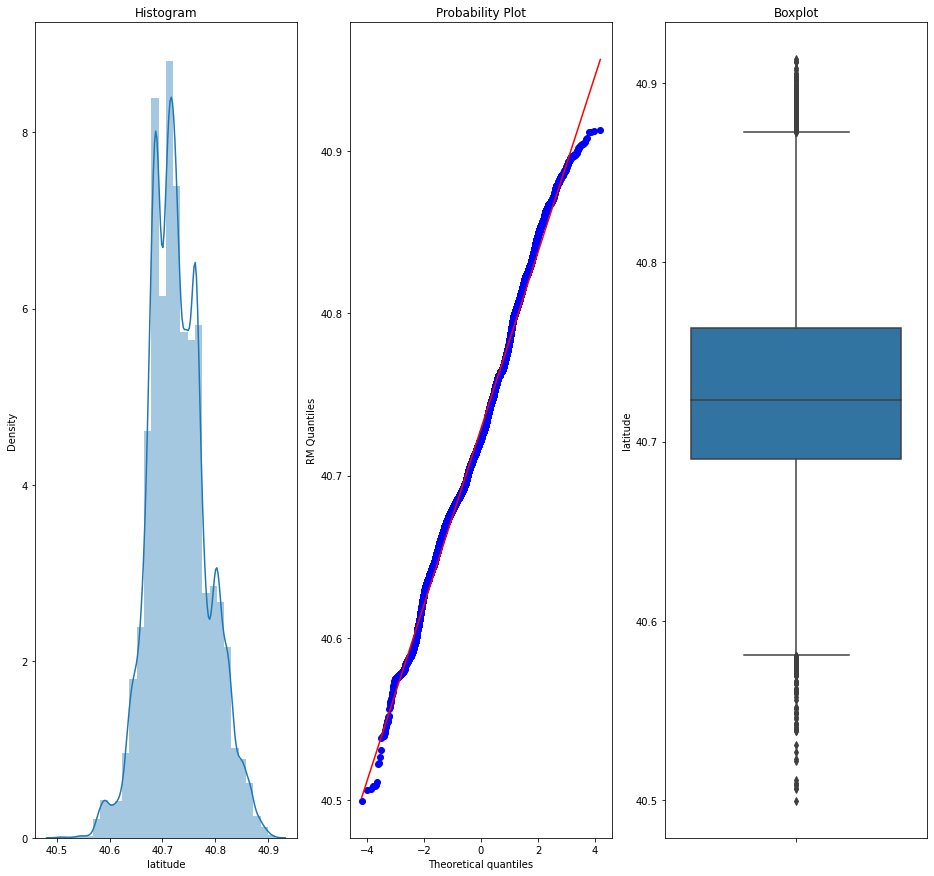

In [91]:
dig_plot(df,'latitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


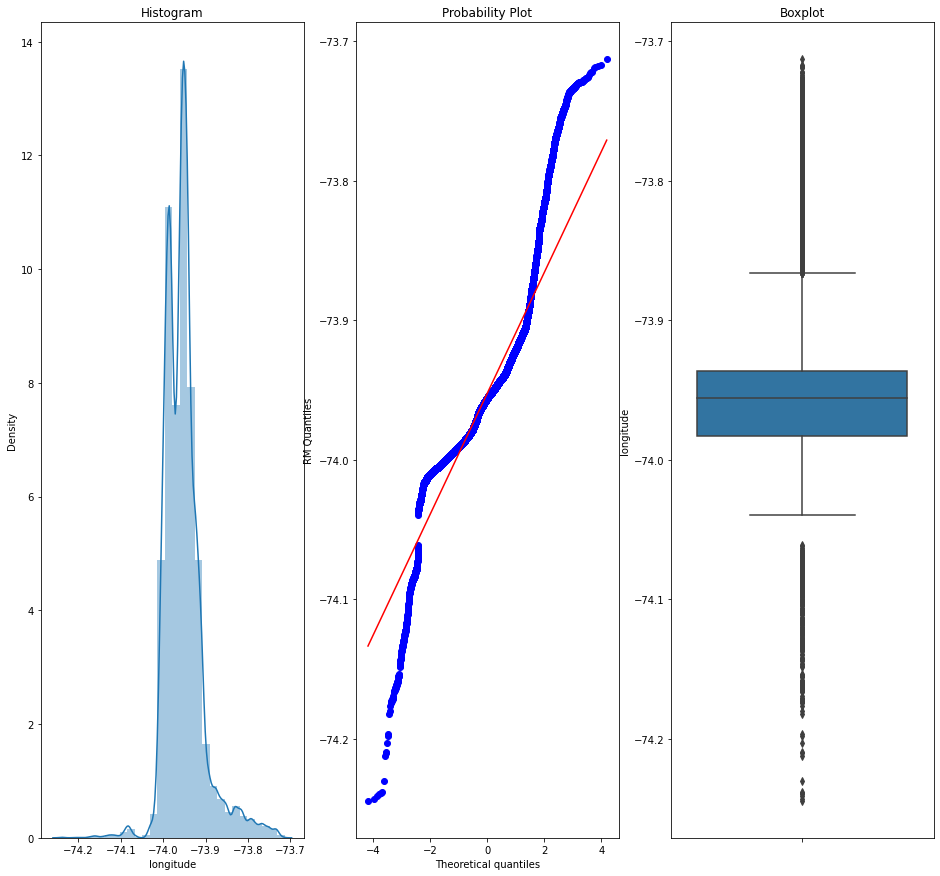

In [92]:
dig_plot(df,'longitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


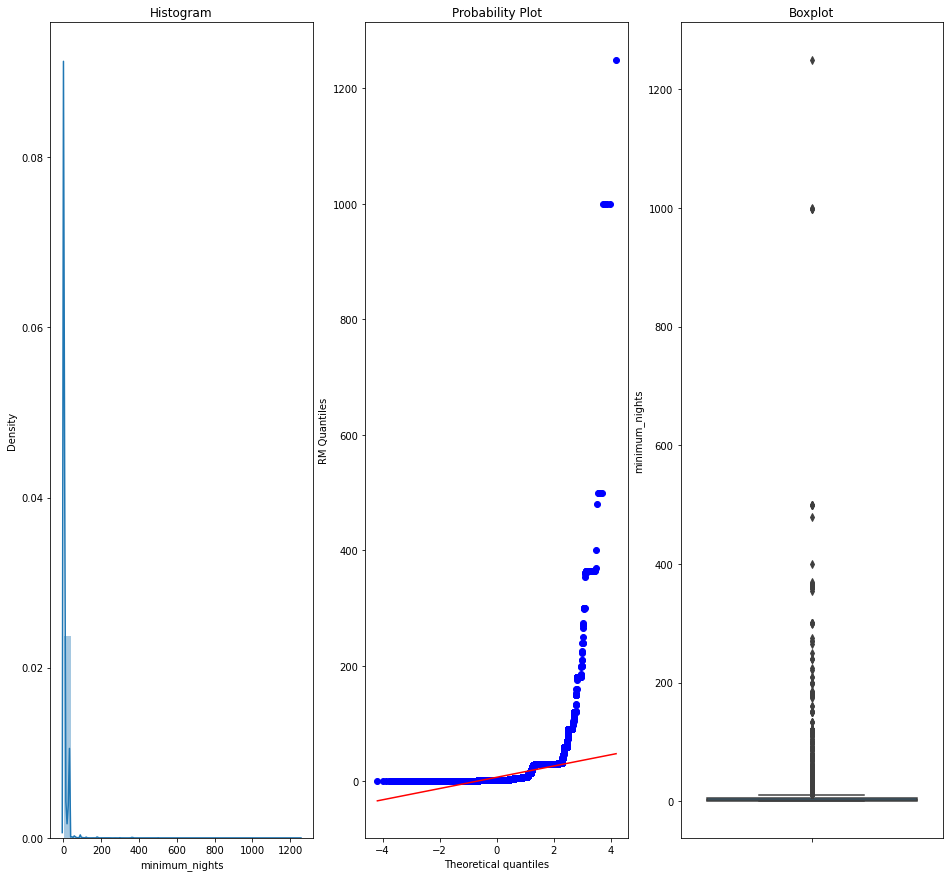

In [93]:
dig_plot(df,'minimum_nights')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


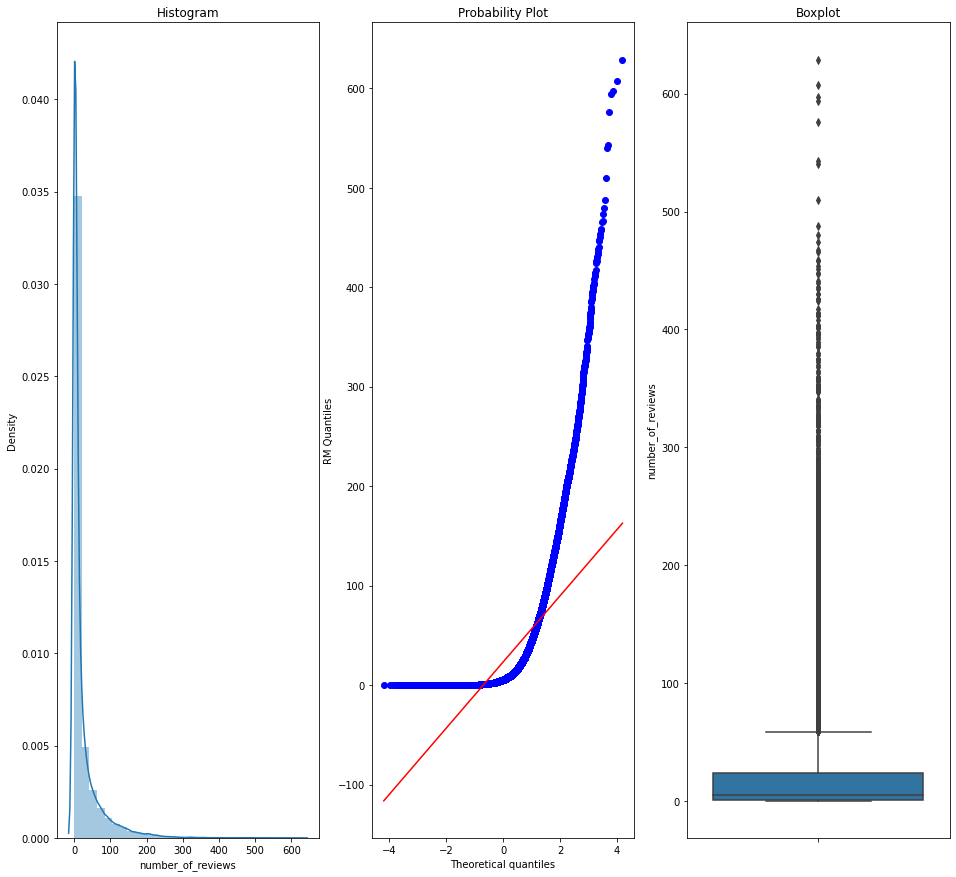

In [94]:
dig_plot(df,'number_of_reviews')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


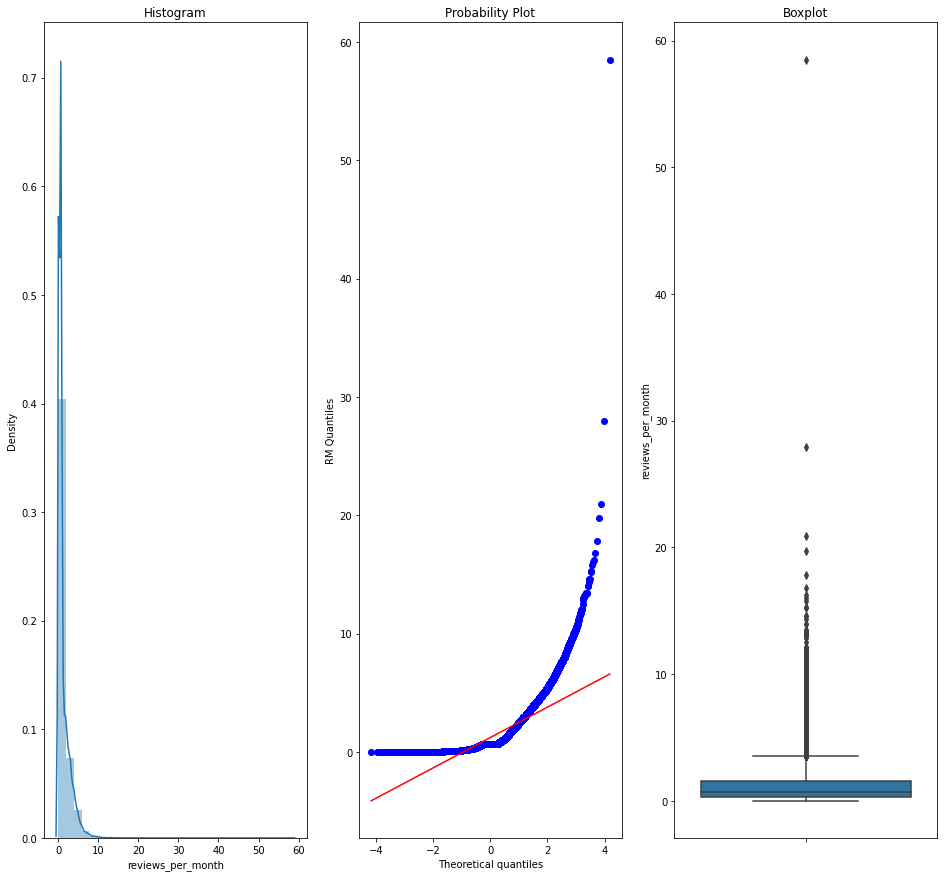

In [95]:
dig_plot(df,'reviews_per_month')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


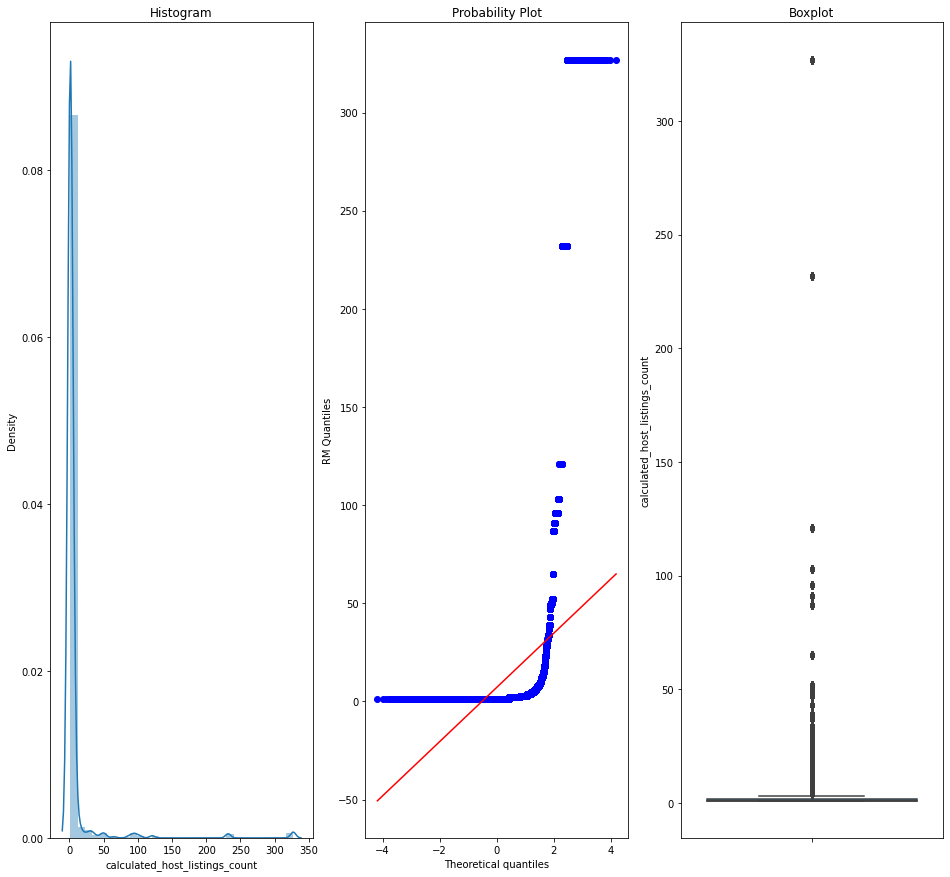

In [96]:
dig_plot(df,'calculated_host_listings_count')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


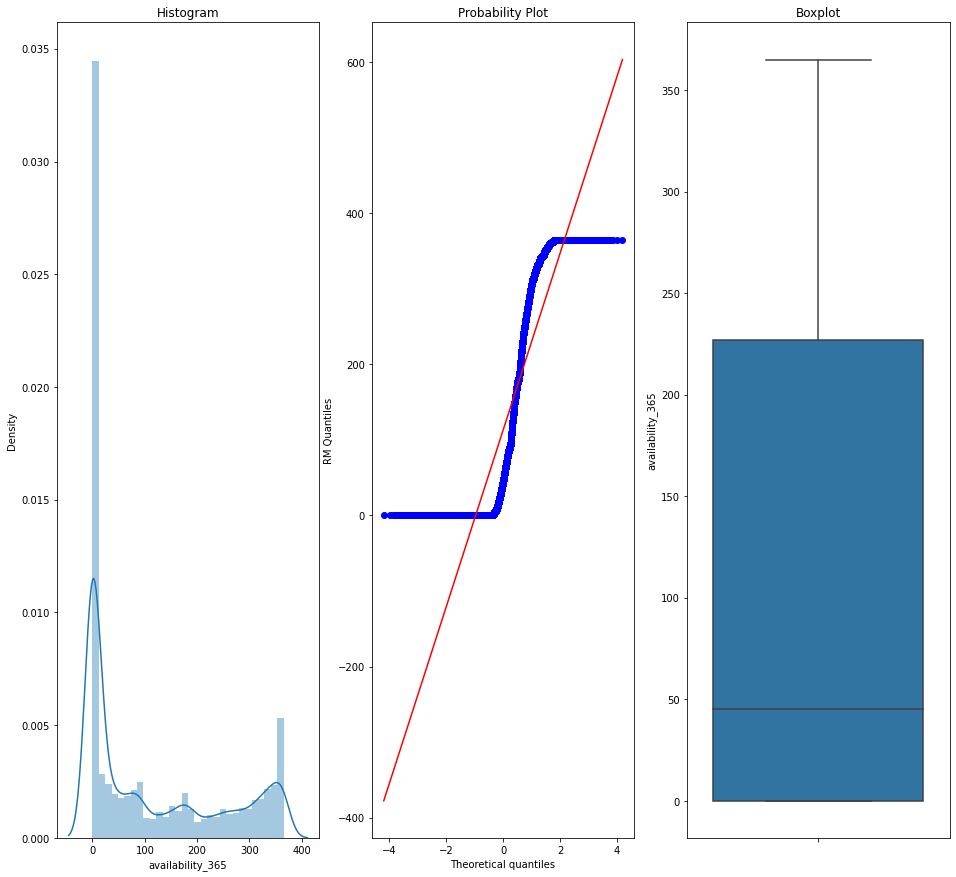

In [97]:
dig_plot(df,'availability_365')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


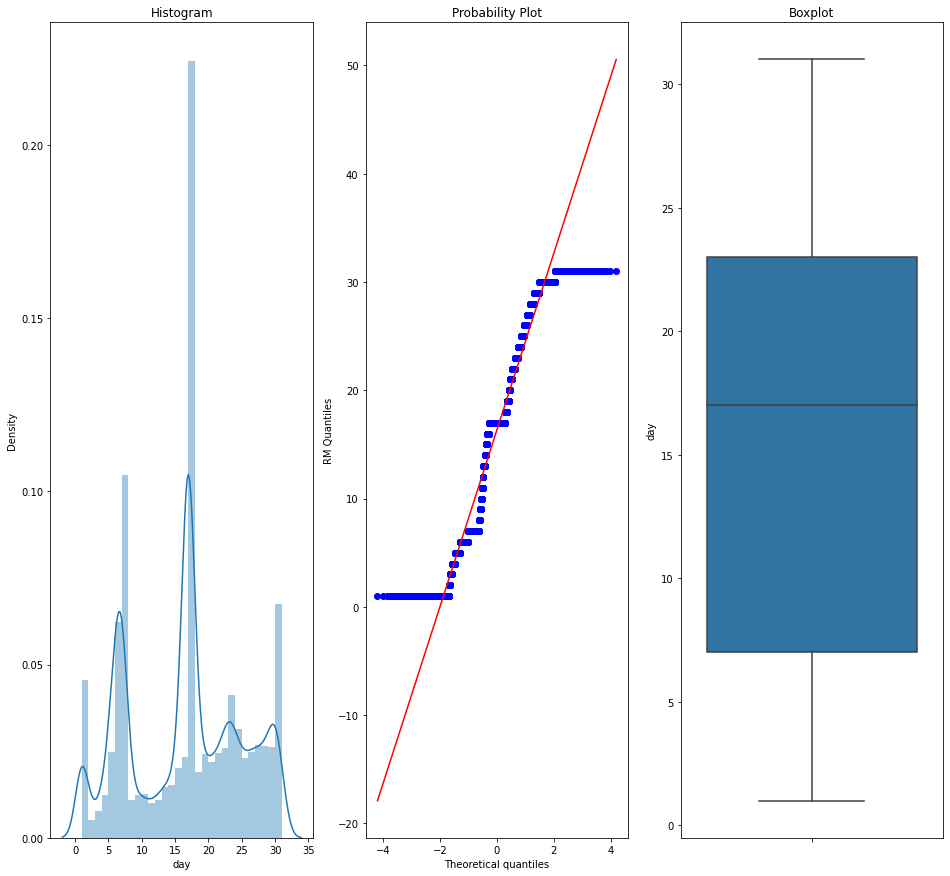

In [98]:
dig_plot(df,'day')

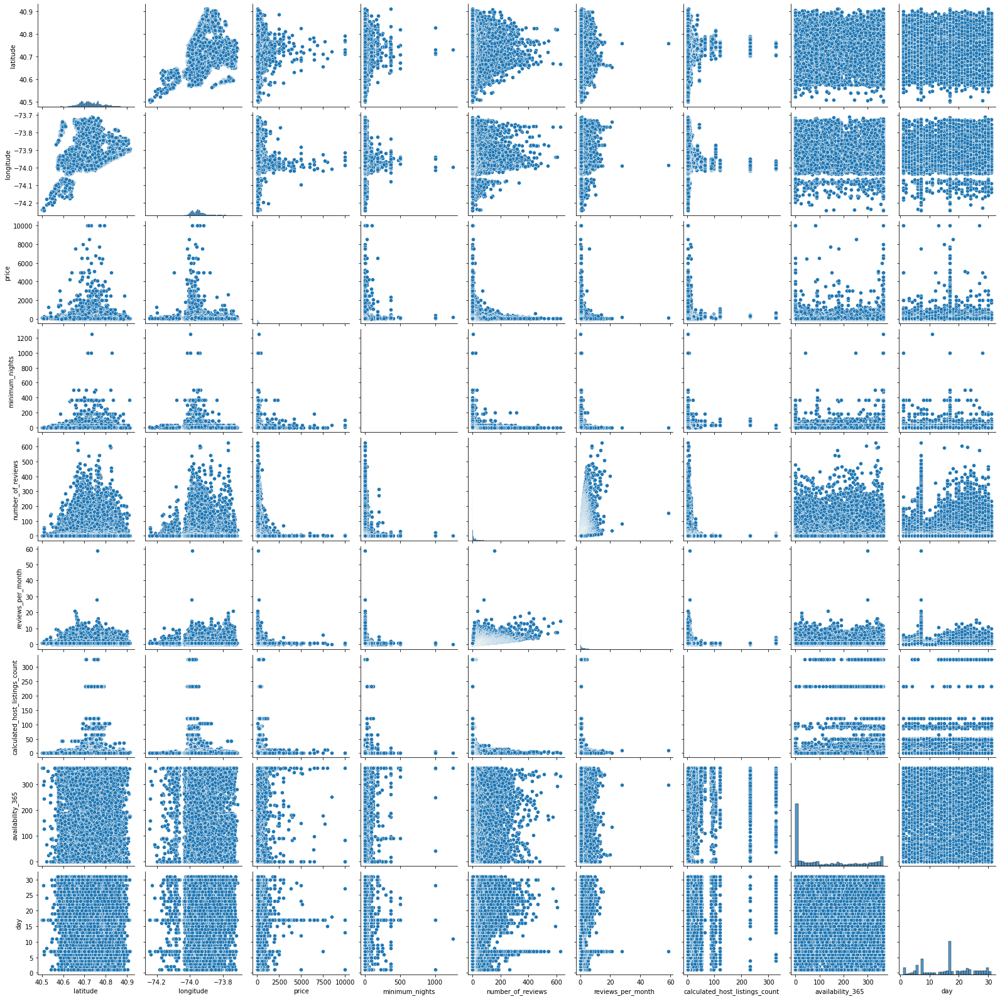

In [99]:
import seaborn as sns
sns.pairplot(df[continuous])

In [100]:
def skewed_bound(d,var,dist):
    IQR=d[var].quantile(0.75)-d[var].quantile(0.25)
    lower_bound=d[var].quantile(0.25) - (IQR * dist)
    upper_bound=d[var].quantile(0.75) + (IQR * dist)
    return lower_bound,upper_bound

In [101]:
df1=df.copy()

In [102]:
lat_upper,lat_lower=skewed_bound(df1,'latitude',1.5)
lat_upper,lat_lower

(40.580577500000004, 40.872637499999996)

In [103]:
lon_upper,lon_lower=skewed_bound(df1,'longitude',1.5)
lon_upper,lon_lower

(-74.0532625, -73.86608249999999)

In [104]:
min_nig_upper,min_nig_lower=skewed_bound(df1,'minimum_nights',1.5)
min_nig_upper,min_nig_lower

(-5.0, 11.0)

In [105]:
no_rev_upper,no_rev_lower=skewed_bound(df1,'number_of_reviews',1.5)
no_rev_upper,no_rev_lower

(-33.5, 58.5)

In [106]:
rev_permon_upper,re_permon_lower=skewed_bound(df1,'reviews_per_month',1.5)
rev_permon_upper,re_permon_lower

(-1.6700000000000002, 3.5300000000000002)

In [107]:
cal_host_upper,cal_host_lower=skewed_bound(df1,'calculated_host_listings_count',1.5)
cal_host_upper,cal_host_lower

(-0.5, 3.5)

In [108]:
avail_upper,avail_lower=skewed_bound(df1,'availability_365',1.5)
avail_upper,avail_lower

(-340.5, 567.5)

In [109]:
year_upper,year_lower=skewed_bound(df1,'day',1.5)
year_upper,year_lower

(-17.0, 47.0)

In [110]:
df1.corr()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
latitude,1.000000,0.084788,0.033939,0.024869,-0.015389,-0.014078,0.019517,-0.010983,-0.010079,-0.001155,0.001229,-0.003140
longitude,0.084788,1.000000,-0.150019,-0.062747,0.059094,0.137153,-0.114713,0.082731,0.076946,-0.008835,-0.012007,0.017518
price,0.033939,-0.150019,1.000000,0.042799,-0.047954,-0.036814,0.057472,0.081829,0.010729,0.002384,-0.001297,-0.004629
minimum_nights,0.024869,-0.062747,0.042799,1.000000,-0.080116,-0.109876,0.127960,0.144303,-0.005913,0.011126,0.001975,-0.005355
number_of_reviews,-0.015389,0.059094,-0.047954,-0.080116,1.000000,0.568177,-0.072376,0.172028,0.183003,-0.053492,0.027778,0.037155
reviews_per_month,-0.014078,0.137153,-0.036814,-0.109876,0.568177,1.000000,-0.027097,0.165954,0.356997,-0.102948,0.002130,0.059062
calculated_host_listings_count,0.019517,-0.114713,0.057472,0.127960,-0.072376,-0.027097,1.000000,0.225701,0.067567,0.007433,0.009740,-0.003520
availability_365,-0.010983,0.082731,0.081829,0.144303,0.172028,0.165954,0.225701,1.000000,0.256517,-0.047805,0.010170,0.032877
year,-0.010079,0.076946,0.010729,-0.005913,0.183003,0.356997,0.067567,0.256517,1.000000,-0.228896,-0.008705,0.039239
month,-0.001155,-0.008835,0.002384,0.011126,-0.053492,-0.102948,0.007433,-0.047805,-0.228896,1.000000,0.212735,0.121628


In [111]:
df1['latitude']=np.where(df1['latitude']>lat_upper,lat_upper,np.where(df1['latitude']<lat_lower,lat_lower,df1['latitude']))
df1['longitude']=np.where(df1['longitude']>lon_upper,lon_upper,np.where(df1['longitude']<lon_lower,lon_lower,df1['longitude']))
df1['minimum_nights']=np.where(df1['minimum_nights']>min_nig_upper,min_nig_upper,np.where(df1['minimum_nights']<min_nig_lower,min_nig_lower,df1['minimum_nights']))
df1['number_of_reviews']=np.where(df1['number_of_reviews']>no_rev_upper,no_rev_upper,np.where(df1['number_of_reviews']<no_rev_lower,no_rev_lower,df1['number_of_reviews']))
df1['calculated_host_listings_count']=np.where(df1['calculated_host_listings_count']>cal_host_upper,cal_host_upper,np.where(df1['calculated_host_listings_count']<cal_host_lower,cal_host_lower,df1['calculated_host_listings_count']))
df1['availability_365']=np.where(df1['availability_365']>avail_upper,avail_upper,np.where(df1['availability_365']<avail_lower,avail_lower,df1['availability_365']))
df1['day']=np.where(df1['day']>year_upper,year_upper,np.where(df1['day']<year_lower,year_lower,df1['day']))
                                

In [112]:
df1.corr()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
latitude,1.000000,0.257600,-0.005093,NaN,NaN,0.006040,NaN,NaN,0.017700,-0.000289,NaN,0.007995
longitude,0.257600,1.000000,-0.013840,NaN,NaN,0.026020,NaN,NaN,0.030381,-0.011849,NaN,0.003106
price,-0.005093,-0.013840,1.000000,NaN,NaN,-0.036814,NaN,NaN,0.010729,0.002384,NaN,-0.004629
minimum_nights,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
number_of_reviews,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
reviews_per_month,0.006040,0.026020,-0.036814,NaN,NaN,1.000000,NaN,NaN,0.356997,-0.102948,NaN,0.059062
calculated_host_listings_count,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
availability_365,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
year,0.017700,0.030381,0.010729,NaN,NaN,0.356997,NaN,NaN,1.000000,-0.228896,NaN,0.039239
month,-0.000289,-0.011849,0.002384,NaN,NaN,-0.102948,NaN,NaN,-0.228896,1.000000,NaN,0.121628


c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


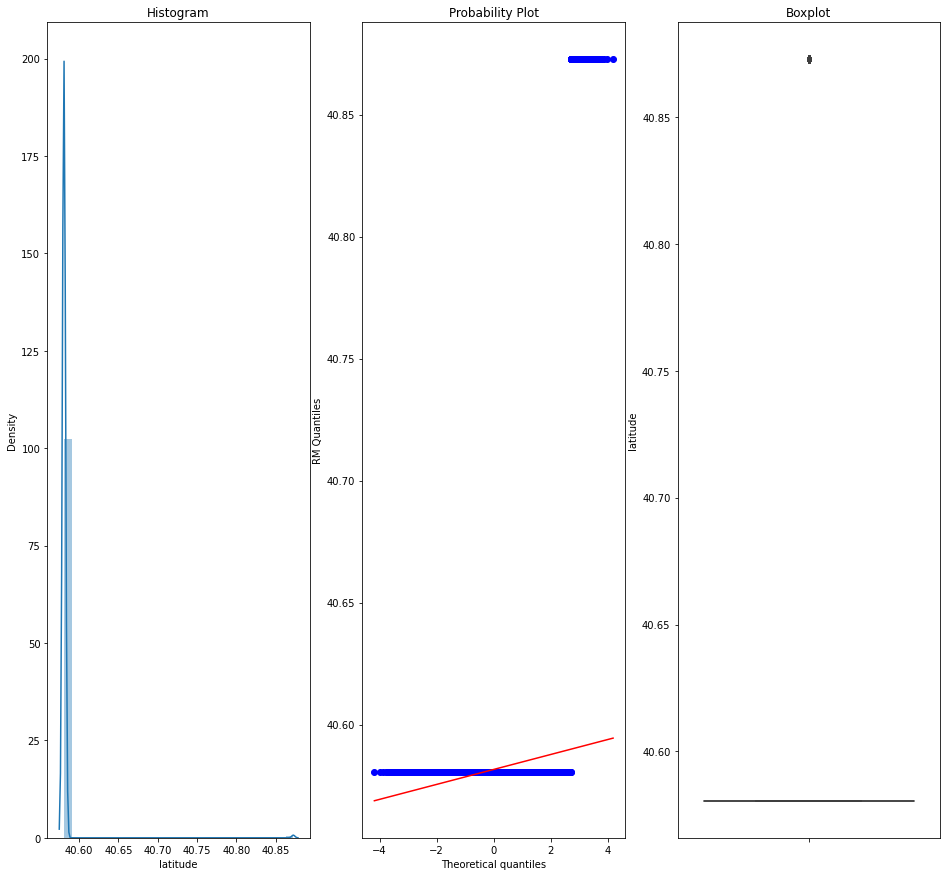

In [113]:
dig_plot(df1,'latitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


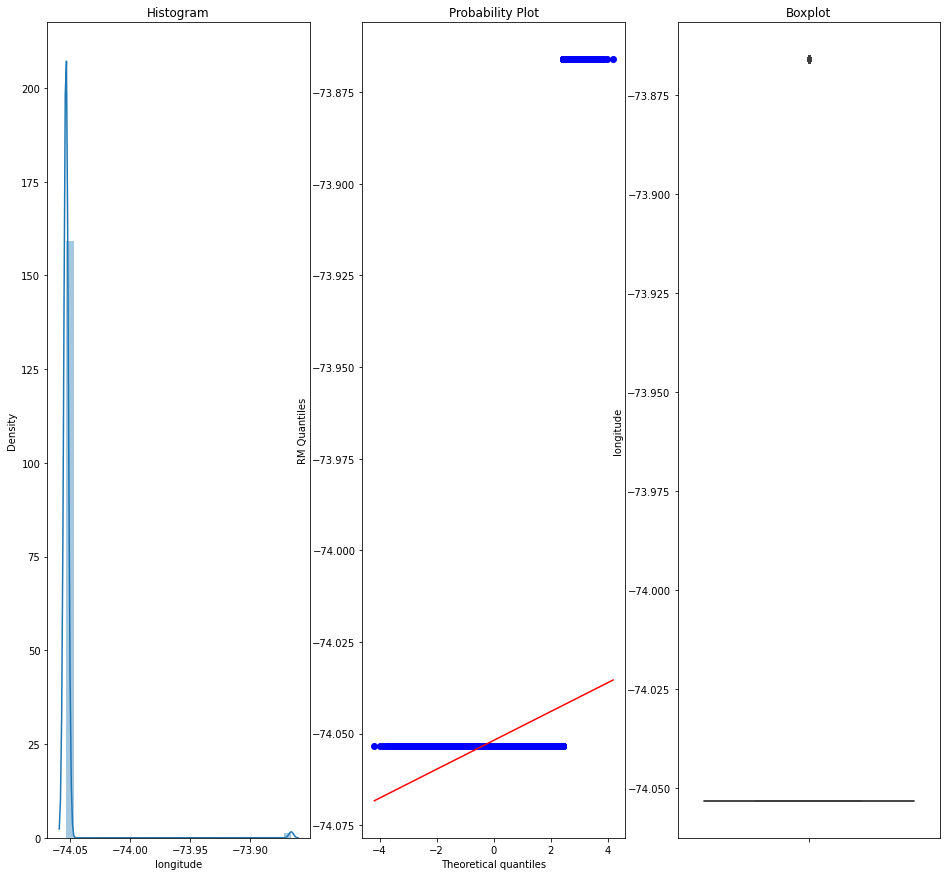

In [114]:
dig_plot(df1,'longitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python\python39\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


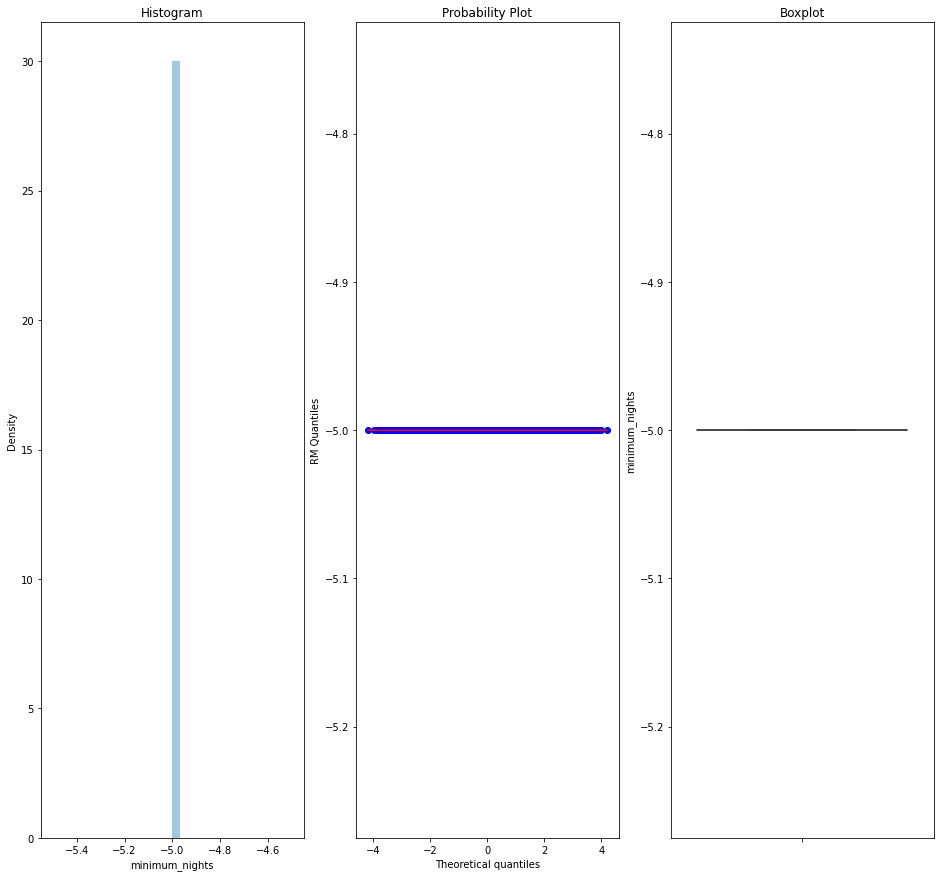

In [115]:
dig_plot(df1,'minimum_nights')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python\python39\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


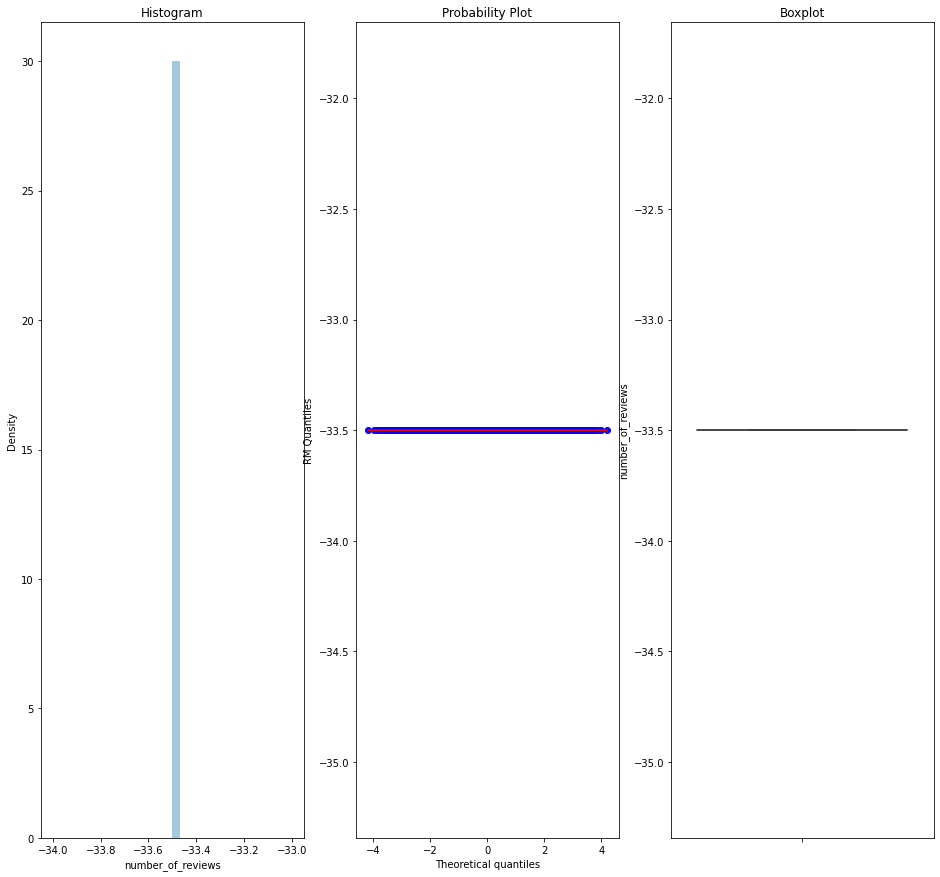

In [116]:
dig_plot(df1,'number_of_reviews')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python\python39\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


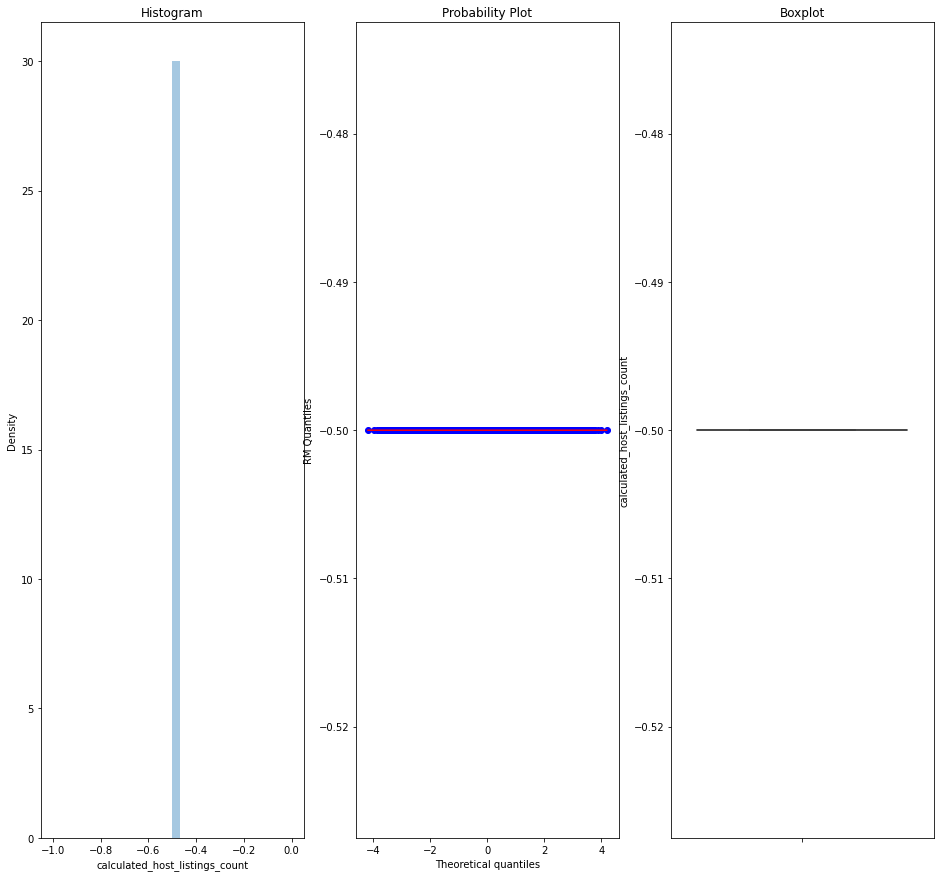

In [117]:
dig_plot(df1,'calculated_host_listings_count')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python\python39\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


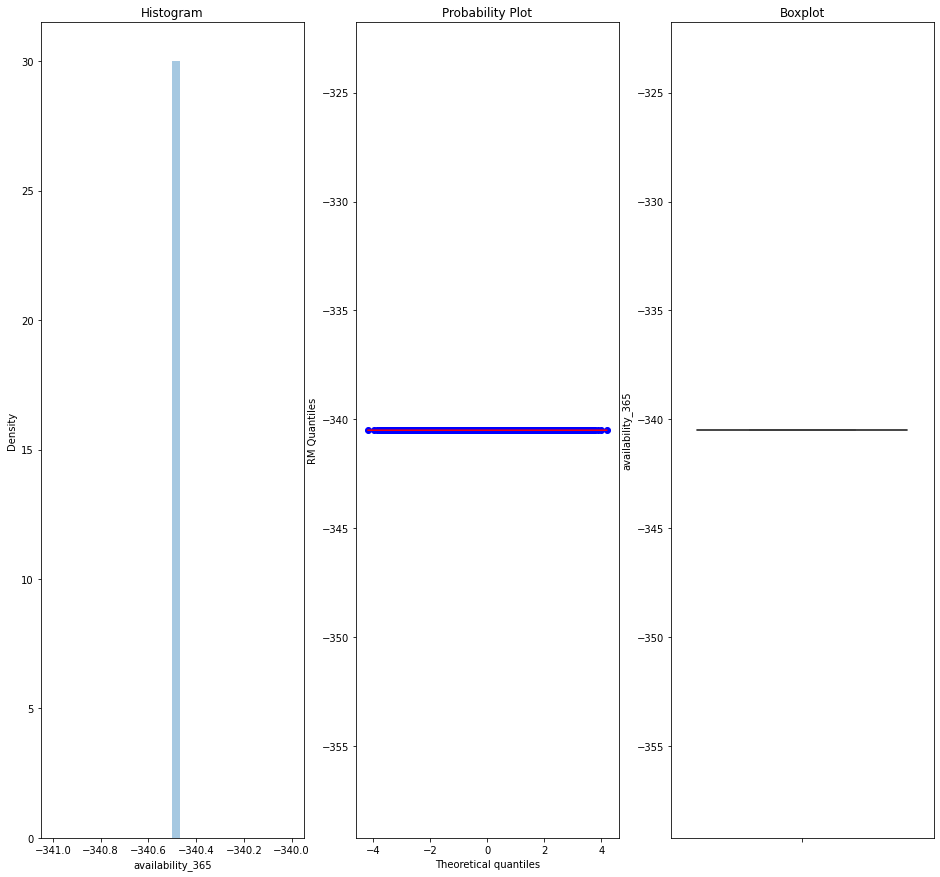

In [118]:
dig_plot(df1,'availability_365')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\python\python39\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


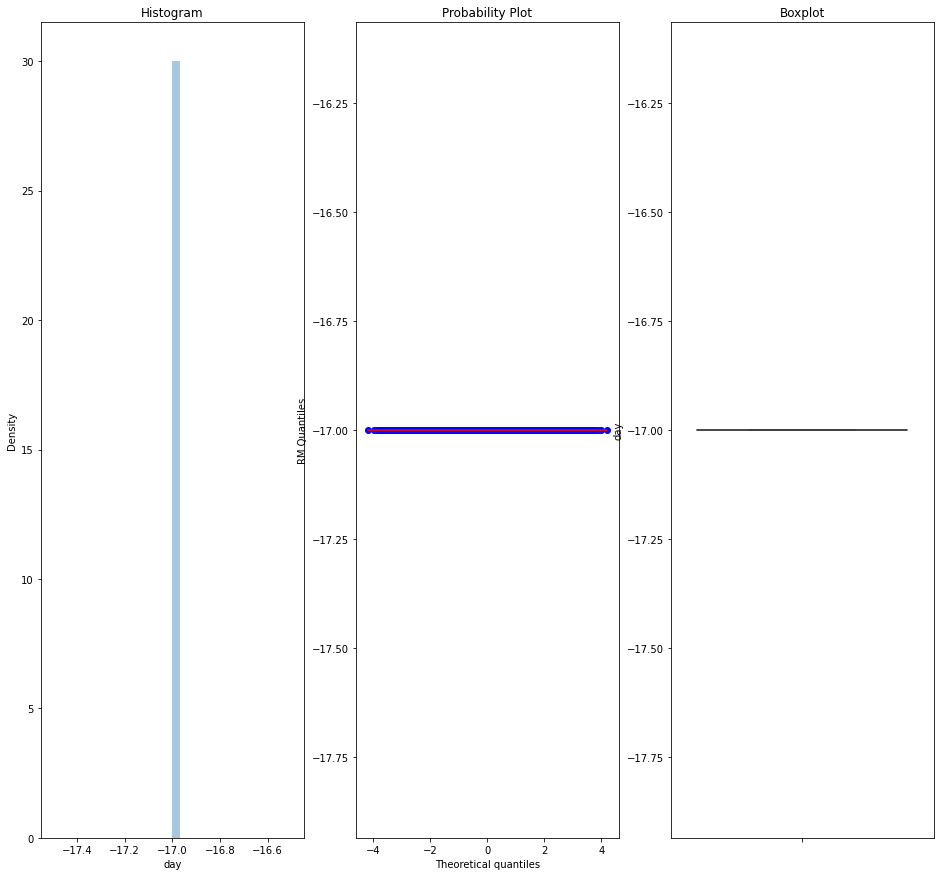

In [119]:
dig_plot(df1,'day')

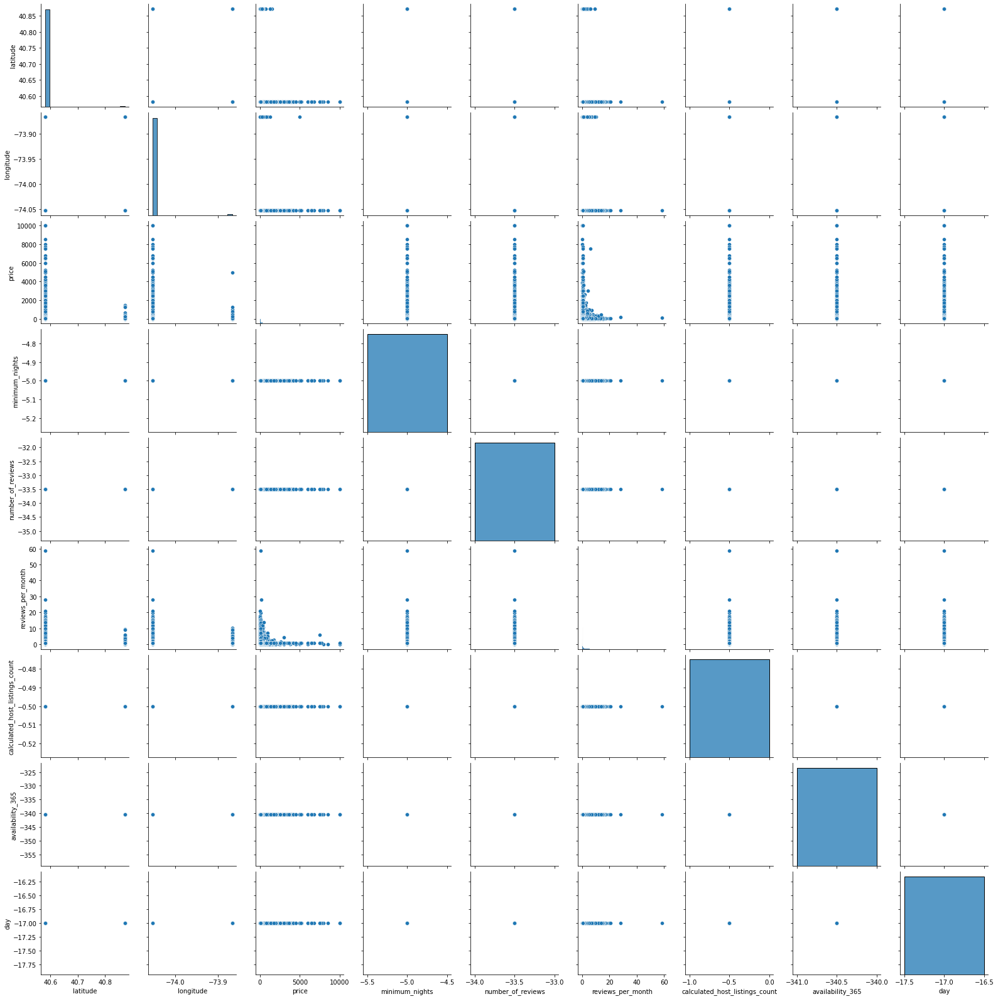

In [120]:
sns.pairplot(df1[continuous])

In [121]:
df1.shape

(48895, 15)

In [122]:
df2=df.copy()

In [123]:
def normal_dis(d,var,dist):
    upper_bound=d[var].mean()+dist*d[var].std()
    lower_bound=d[var].mean()-dist*d[var].std()
    return upper_bound,lower_bound

In [124]:
lat_upper,lat_lower=normal_dis(df2,'latitude',3)
lat_upper,lat_lower

(40.89253911483476, 40.56535864649052)

In [125]:
lon_upper,lon_lower=normal_dis(df2,'longitude',3)
lon_upper,lon_lower

(-73.81369940636542, -74.09063982300366)

In [126]:
min_nig_upper,min_nig_lower=normal_dis(df2,'minimum_nights',3)
min_nig_upper,min_nig_lower

(68.56161076336004, -54.50168643571918)

In [127]:
no_rev_upper,no_rev_lower=normal_dis(df2,'number_of_reviews',3)
no_rev_upper,no_rev_lower

(156.92621249184032, -110.37728110826328)

In [128]:
rev_permon_upper,re_permon_lower=normal_dis(df2,'reviews_per_month',3)
rev_permon_upper,re_permon_lower

(5.801513562289693, -3.323653658414041)

In [129]:
cal_host_upper,cal_host_lower=normal_dis(df2,'calculated_host_listings_count',3)
cal_host_upper,cal_host_lower

(106.00153855050951, -91.71357454601008)

In [130]:
avail_upper,avail_lower=normal_dis(df2,'availability_365',3)
avail_upper,avail_lower

(507.6481938892276, -282.08553922106114)

In [131]:
year_upper,year_lower=normal_dis(df2,'day',3)
year_upper,year_lower

(41.501082683095966, -8.848173387666982)

In [132]:
df2['latitude']=np.where(df2['latitude']>lat_upper,lat_upper,np.where(df2['latitude']<lat_lower,lat_lower,df2['latitude']))
df2['longitude']=np.where(df2['longitude']>lon_upper,lon_upper,np.where(df2['longitude']<lon_lower,lon_lower,df2['longitude']))
df2['minimum_nights']=np.where(df2['minimum_nights']>min_nig_upper,min_nig_upper,np.where(df2['minimum_nights']<min_nig_lower,min_nig_lower,df2['minimum_nights']))
df2['number_of_reviews']=np.where(df2['number_of_reviews']>no_rev_upper,no_rev_upper,np.where(df2['number_of_reviews']<no_rev_lower,no_rev_lower,df2['number_of_reviews']))
df2['calculated_host_listings_count']=np.where(df2['calculated_host_listings_count']>cal_host_upper,cal_host_upper,np.where(df2['calculated_host_listings_count']<cal_host_lower,cal_host_lower,df2['calculated_host_listings_count']))
df2['availability_365']=np.where(df2['availability_365']>avail_upper,avail_upper,np.where(df2['availability_365']<avail_lower,avail_lower,df2['availability_365']))
df2['day']=np.where(df2['day']>year_upper,year_upper,np.where(df2['day']<year_lower,year_lower,df2['day']))
                                

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


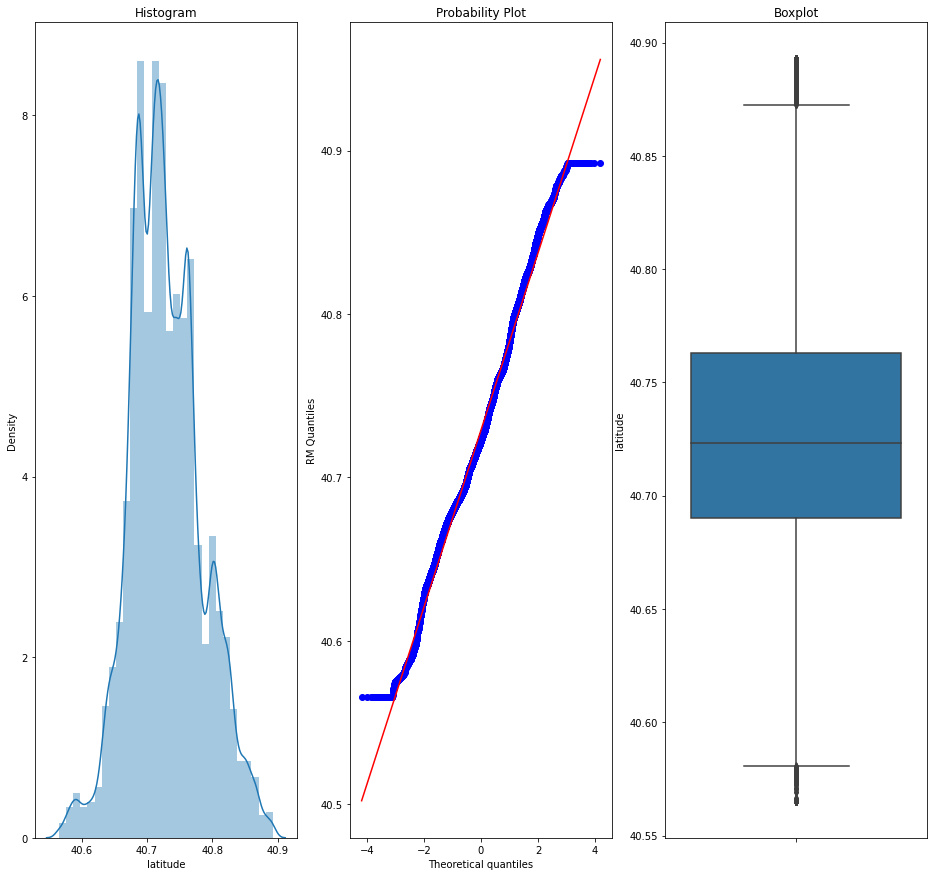

In [169]:
dig_plot(df2,'latitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


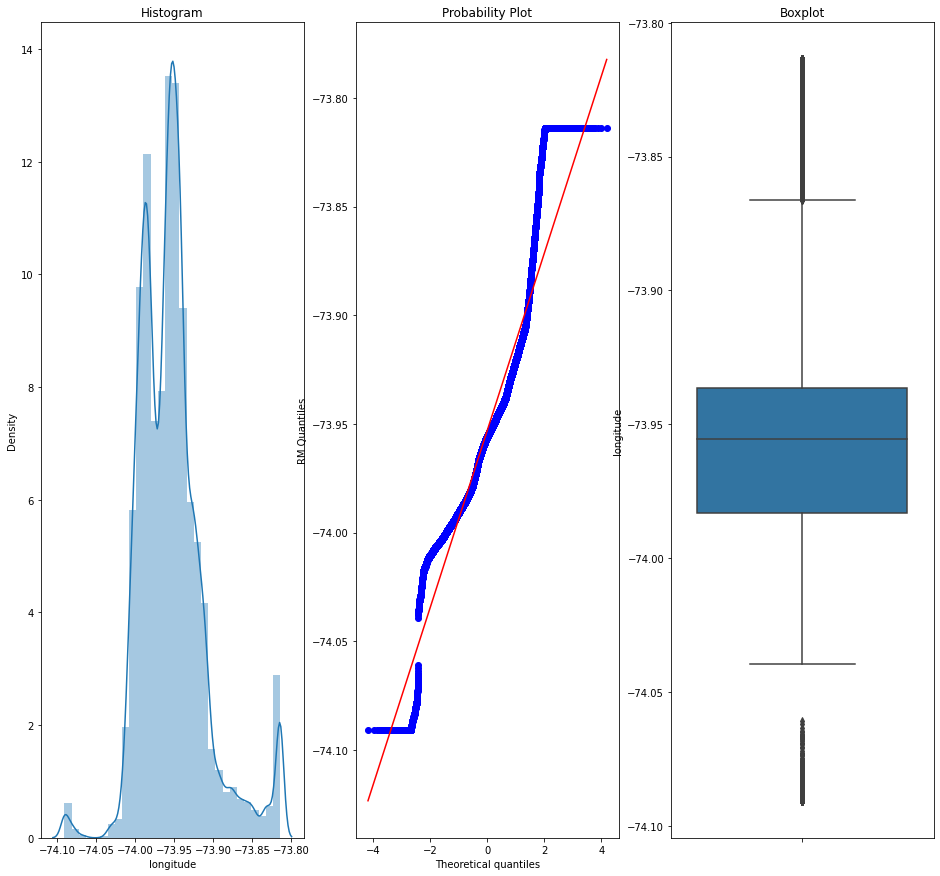

In [170]:
dig_plot(df2,'longitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


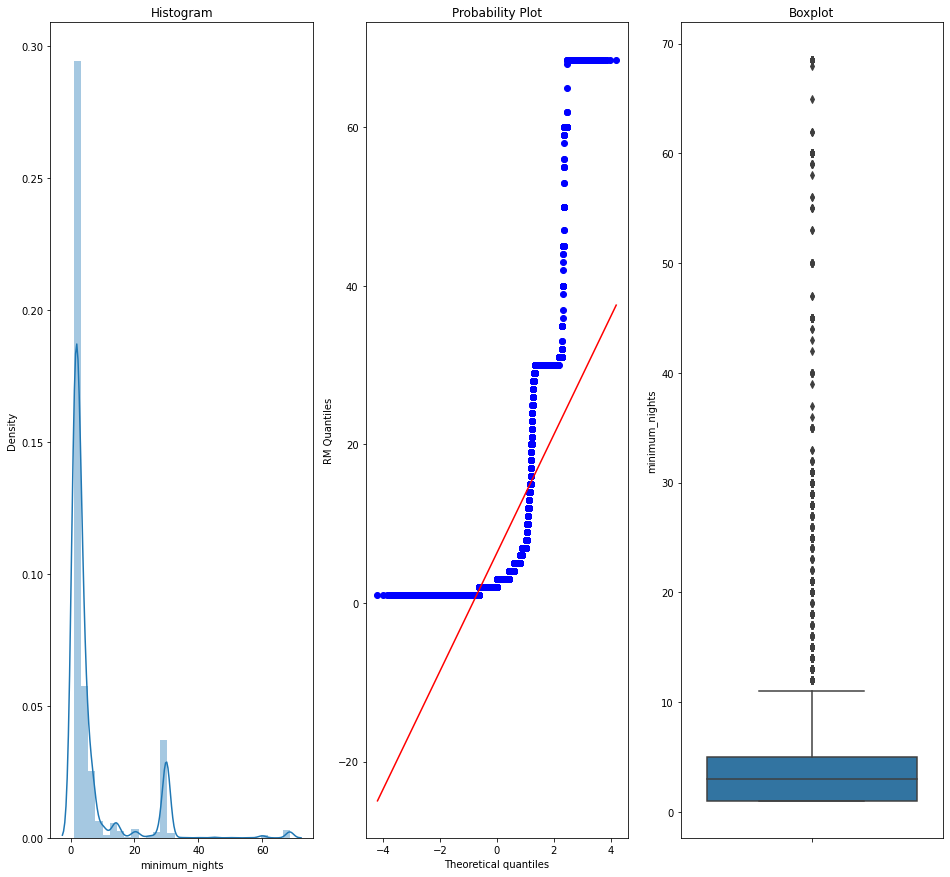

In [171]:
dig_plot(df2,'minimum_nights')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


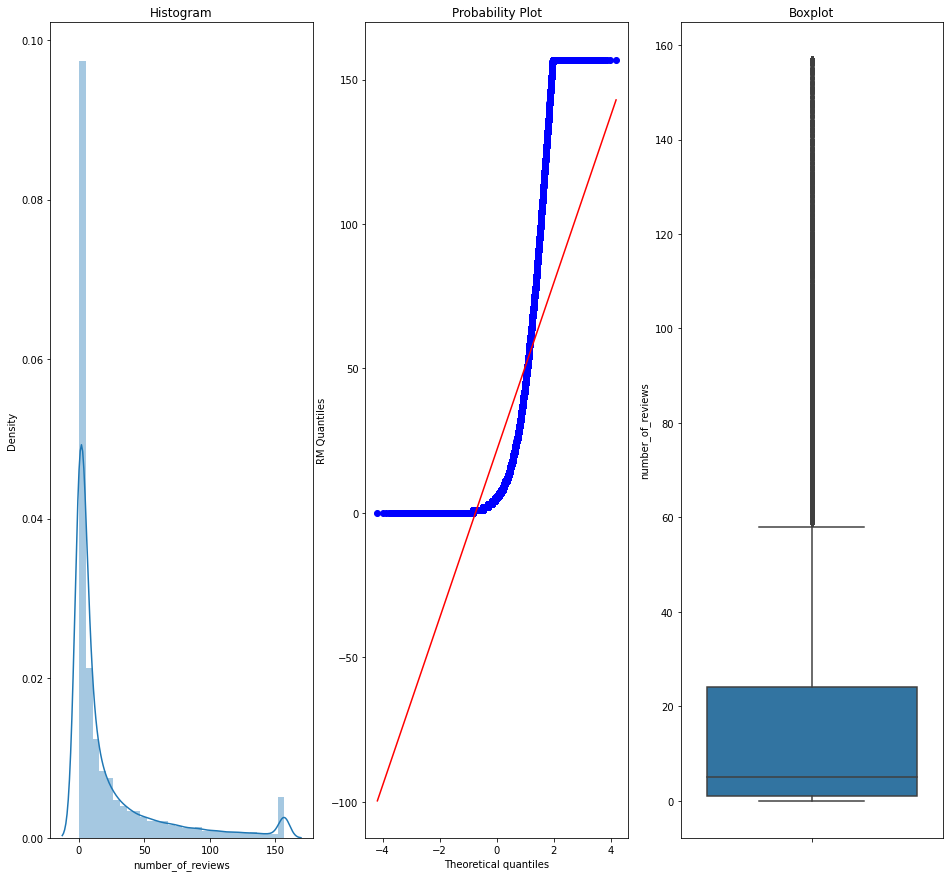

In [172]:
dig_plot(df2,'number_of_reviews')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


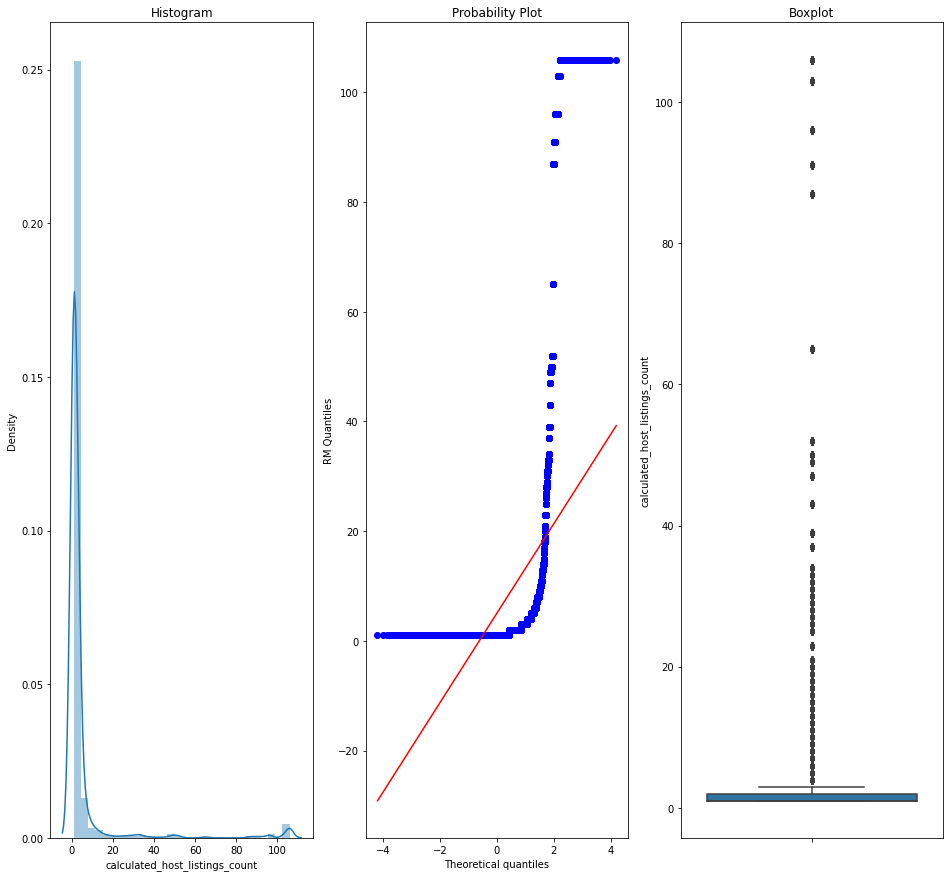

In [173]:
dig_plot(df2,'calculated_host_listings_count')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


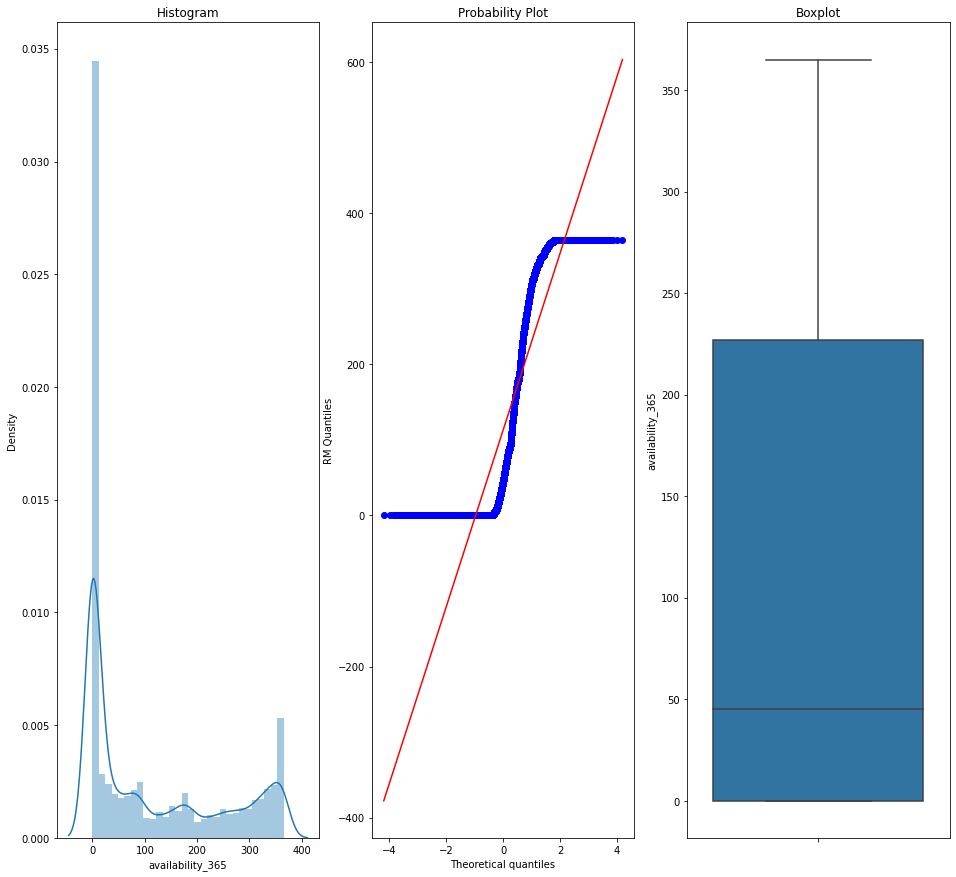

In [174]:
dig_plot(df2,'availability_365')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


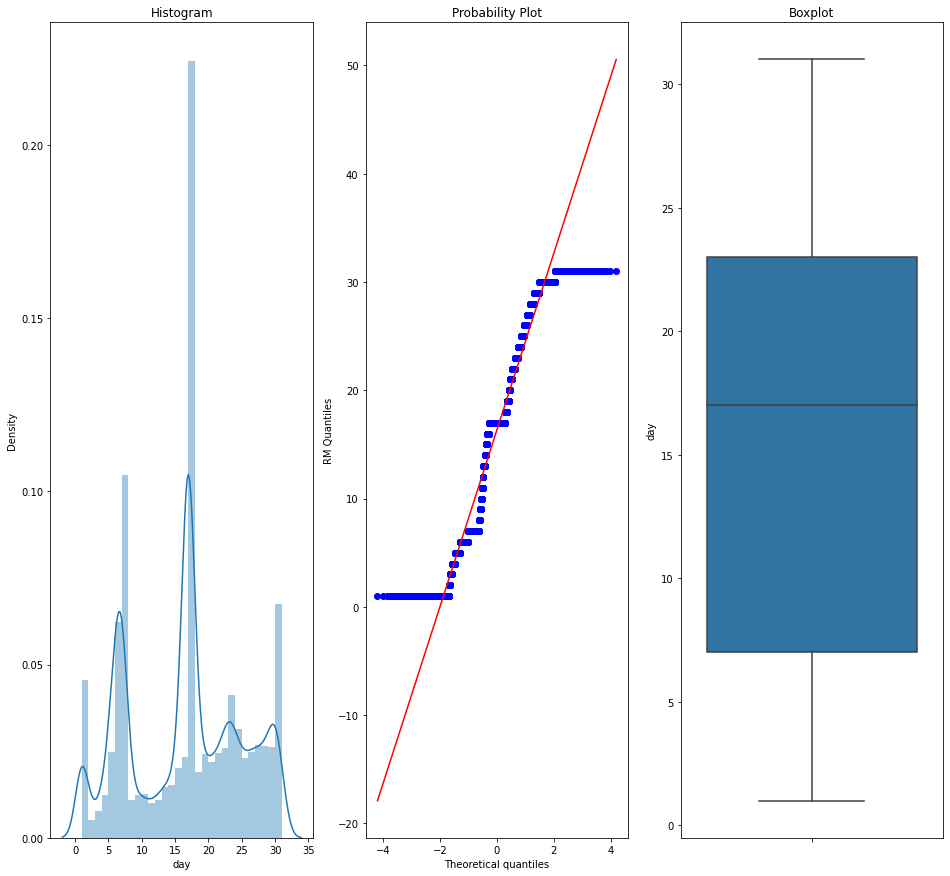

In [175]:
dig_plot(df2,'day')

In [140]:
df2.corr()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
latitude,1.000000,0.095187,0.034081,0.042922,-0.019712,-0.014119,0.042234,-0.010845,-0.009988,-0.001216,0.001083,-0.003309
longitude,0.095187,1.000000,-0.159354,-0.101560,0.059655,0.135532,-0.111137,0.081493,0.078306,-0.009939,-0.013379,0.016013
price,0.034081,-0.159354,1.000000,0.056076,-0.051080,-0.036814,0.054564,0.081829,0.010729,0.002384,-0.001297,-0.004629
minimum_nights,0.042922,-0.101560,0.056076,1.000000,-0.151701,-0.188729,0.377233,0.226293,0.010373,0.013701,0.011202,-0.012656
number_of_reviews,-0.019712,0.059655,-0.051080,-0.151701,1.000000,0.576656,-0.098880,0.184753,0.201724,-0.060837,0.031059,0.041791
reviews_per_month,-0.014119,0.135532,-0.036814,-0.188729,0.576656,1.000000,-0.054530,0.165954,0.356997,-0.102948,0.002130,0.059062
calculated_host_listings_count,0.042234,-0.111137,0.054564,0.377233,-0.098880,-0.054530,1.000000,0.285986,0.071598,0.003102,0.013161,-0.002209
availability_365,-0.010845,0.081493,0.081829,0.226293,0.184753,0.165954,0.285986,1.000000,0.256517,-0.047805,0.010170,0.032877
year,-0.009988,0.078306,0.010729,0.010373,0.201724,0.356997,0.071598,0.256517,1.000000,-0.228896,-0.008705,0.039239
month,-0.001216,-0.009939,0.002384,0.013701,-0.060837,-0.102948,0.003102,-0.047805,-0.228896,1.000000,0.212735,0.121628


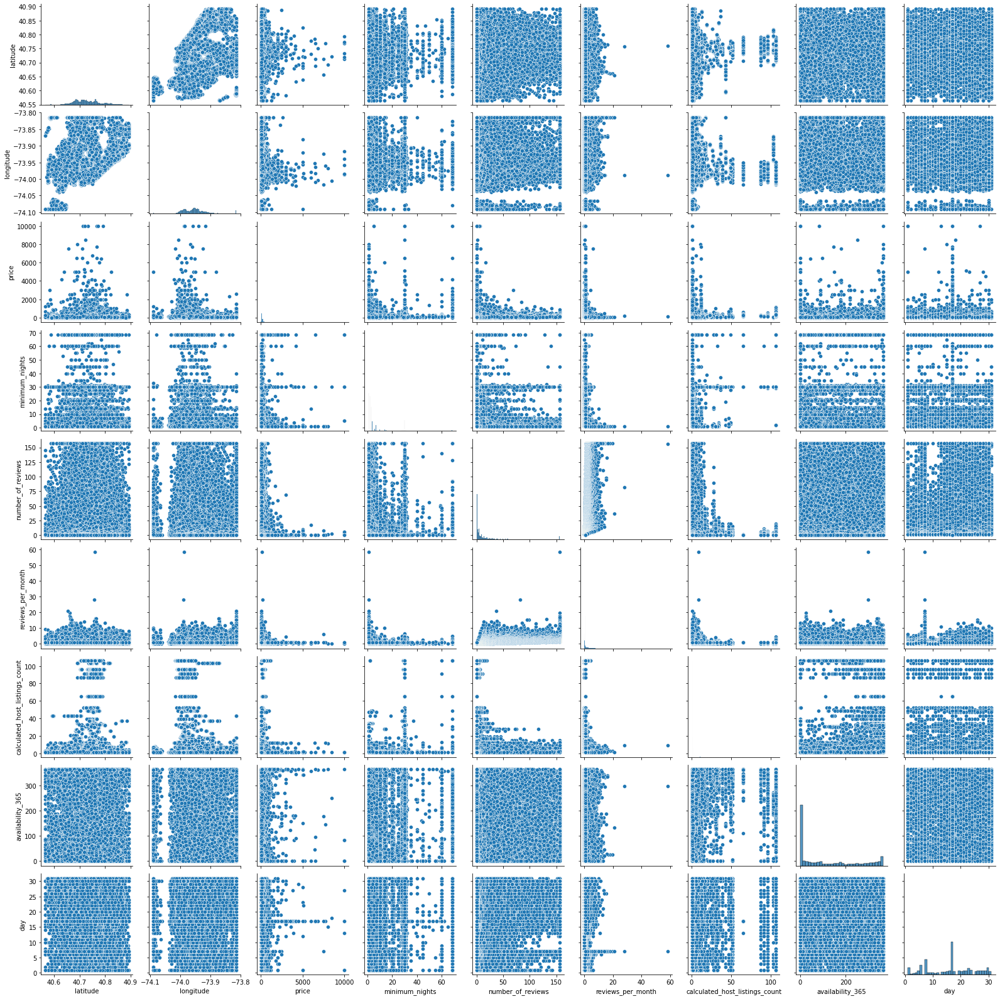

In [141]:
sns.pairplot(df2[continuous])

In [142]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

latitude                            0.073015
longitude                           0.046795
price                             106.000000
minimum_nights                      4.000000
number_of_reviews                  23.000000
reviews_per_month                   1.300000
calculated_host_listings_count      1.000000
availability_365                  227.000000
year                                1.000000
month                               1.000000
day                                16.000000
week_day                            3.000000
dtype: float64


In [143]:
df3=df.copy

In [144]:
df3= df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q1 + 1.5 * IQR))).any(axis=1)]
print(df3.shape)

(7823, 15)


C:\Users\899164\AppData\Local\Temp\3\ipykernel_19792\3919138846.py:1: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  df3= df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q1 + 1.5 * IQR))).any(axis=1)]


In [145]:
df3.head(5)

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
19,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190,7,0,0.72,2,249,2019.0,6.0,17.0,3.0
25,Brooklyn,Windsor Terrace,40.65599,-73.97519,Private room,60,1,19,1.37,2,85,2019.0,6.0,23.0,6.0
56,Manhattan,Lower East Side,40.72004,-73.99104,Private room,110,5,19,0.17,1,301,2019.0,5.0,18.0,5.0
83,Brooklyn,Flatbush,40.65401,-73.96323,Entire home/apt,130,6,16,0.15,1,38,2019.0,6.0,15.0,5.0
90,Brooklyn,Bushwick,40.70032,-73.93830,Private room,65,4,24,0.28,1,317,2019.0,5.0,26.0,6.0


In [146]:
df3.corr()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
latitude,1.000000,-0.034353,0.272392,0.000502,-0.008731,0.006625,-0.054594,-0.059441,-0.003727,0.017155,-0.004056,0.019442
longitude,-0.034353,1.000000,-0.337969,-0.016180,-0.010525,0.013436,0.052308,0.044078,0.007494,0.006708,0.001667,-0.029744
price,0.272392,-0.337969,1.000000,0.018118,0.036656,0.032927,-0.107022,0.059976,0.043852,0.003771,0.008037,0.013682
minimum_nights,0.000502,-0.016180,0.018118,1.000000,0.019019,-0.090986,-0.029215,0.027976,0.002754,-0.071147,-0.007370,-0.022931
number_of_reviews,-0.008731,-0.010525,0.036656,0.019019,1.000000,0.259721,0.097907,0.240050,-0.073660,-0.245622,0.168626,0.083133
reviews_per_month,0.006625,0.013436,0.032927,-0.090986,0.259721,1.000000,0.049959,0.180606,0.442030,0.253515,0.157014,0.087091
calculated_host_listings_count,-0.054594,0.052308,-0.107022,-0.029215,0.097907,0.049959,1.000000,0.156175,0.025799,-0.042747,0.026148,0.034645
availability_365,-0.059441,0.044078,0.059976,0.027976,0.240050,0.180606,0.156175,1.000000,0.124545,-0.037628,0.096172,0.043287
year,-0.003727,0.007494,0.043852,0.002754,-0.073660,0.442030,0.025799,0.124545,1.000000,0.345926,0.070250,0.006997
month,0.017155,0.006708,0.003771,-0.071147,-0.245622,0.253515,-0.042747,-0.037628,0.345926,1.000000,0.028865,0.019193


In [147]:
df3.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
year                              0
month                             0
day                               0
week_day                          0
dtype: int64

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


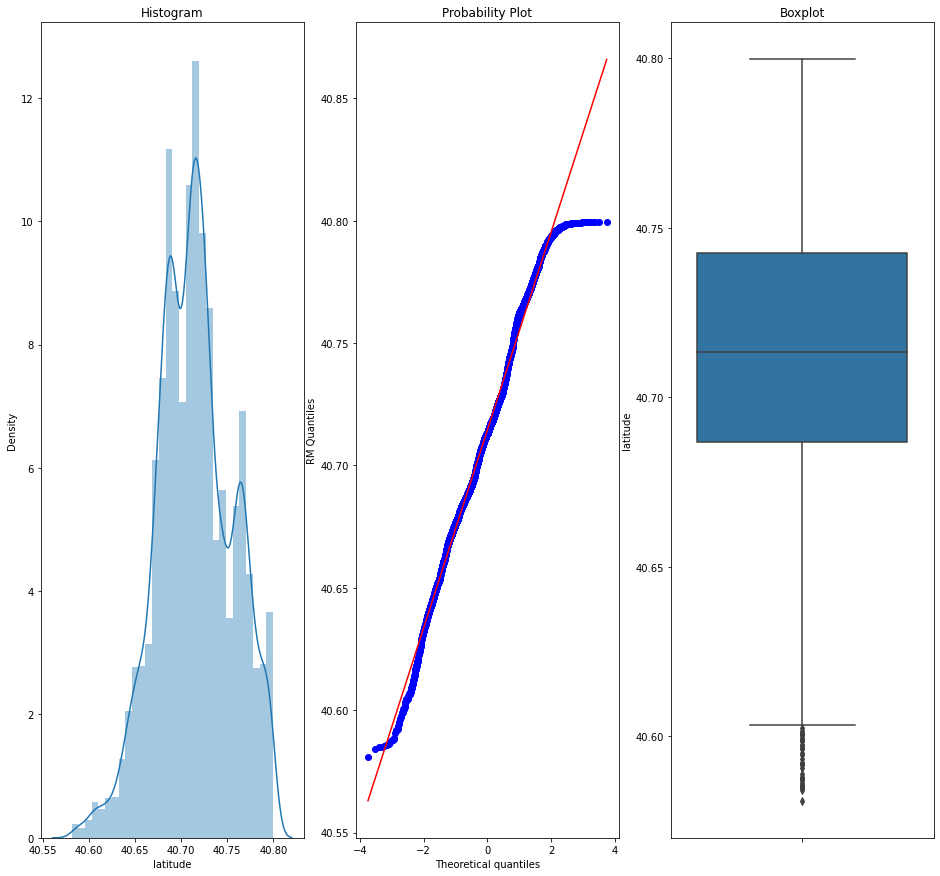

In [148]:
dig_plot(df3,'latitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


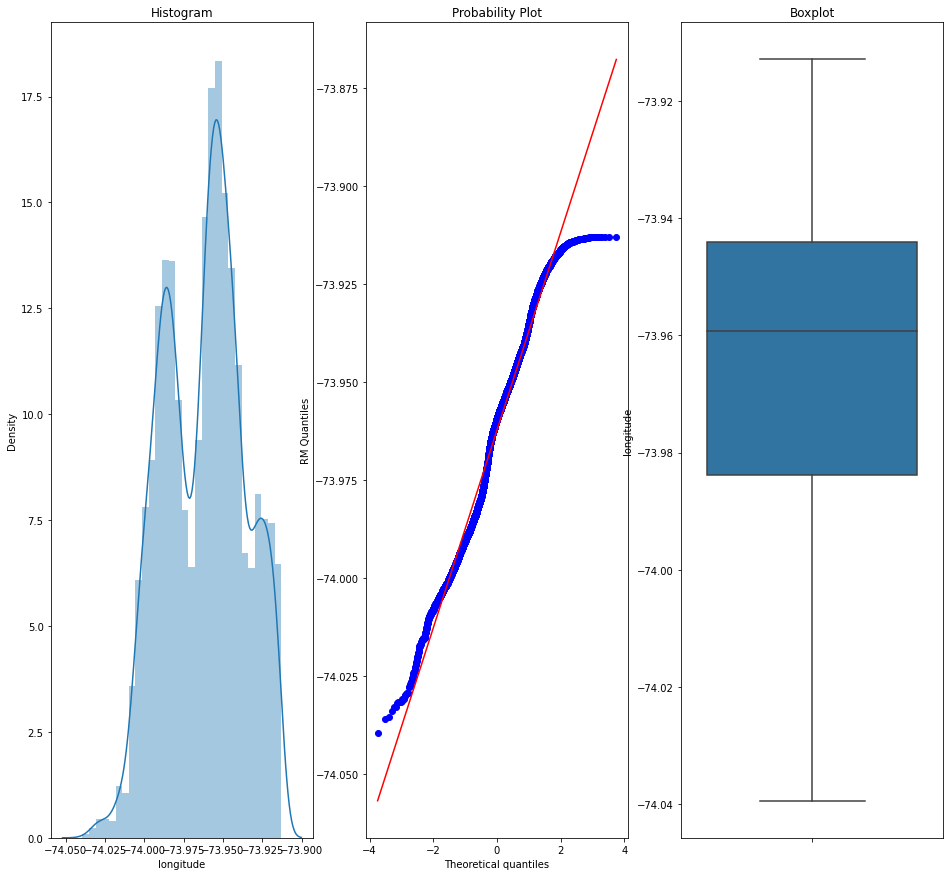

In [149]:
dig_plot(df3,'longitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


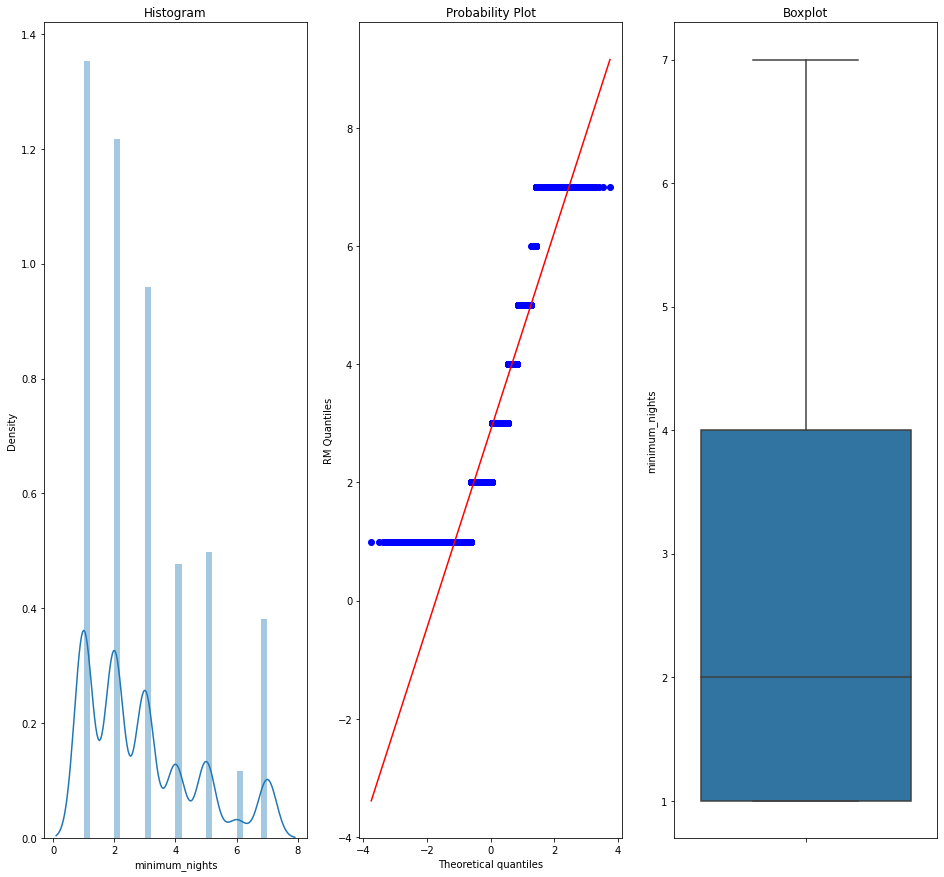

In [150]:
dig_plot(df3,'minimum_nights')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


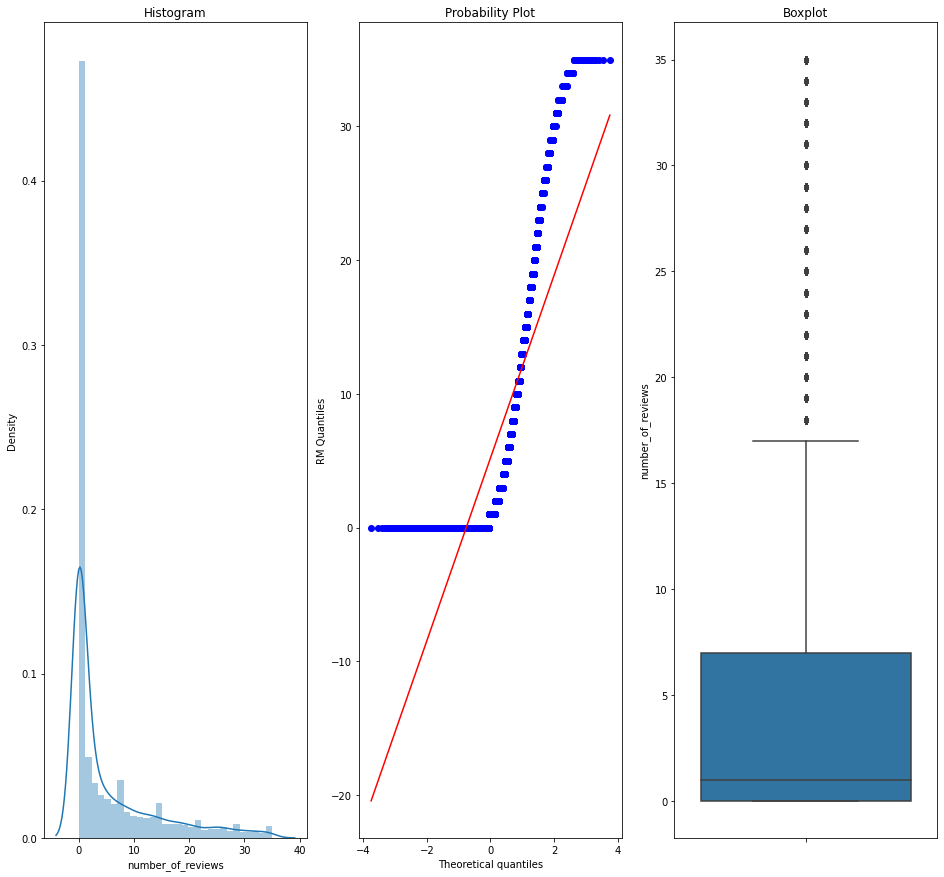

In [151]:
dig_plot(df3,'number_of_reviews')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


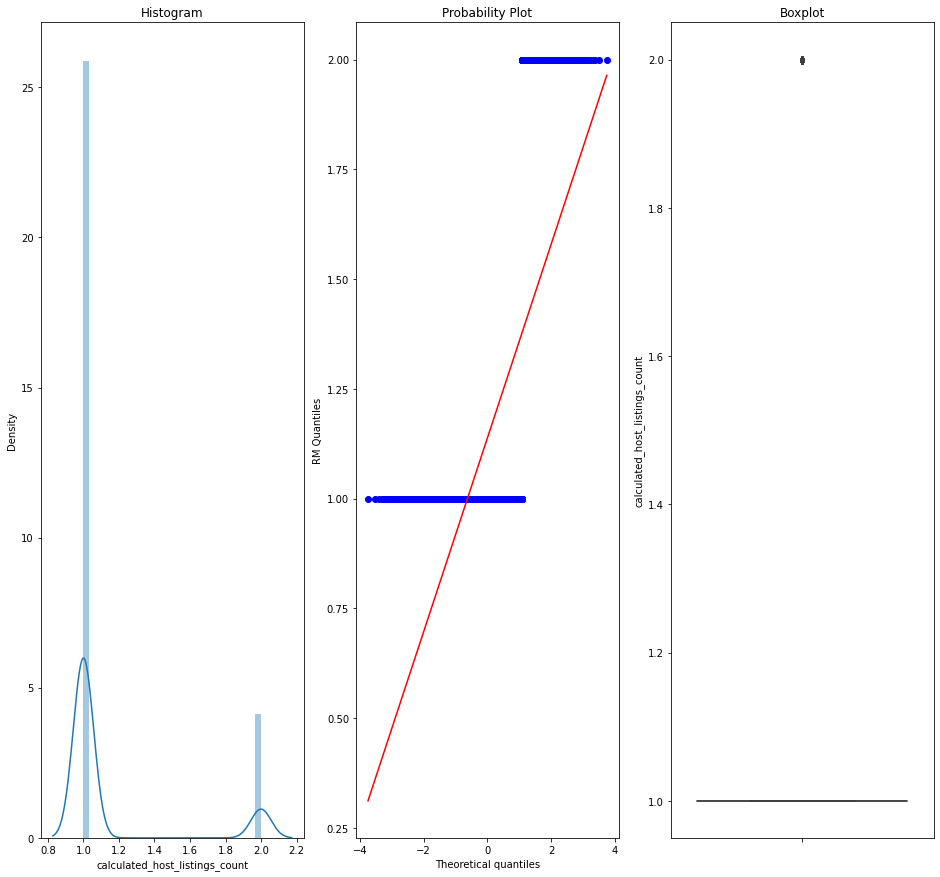

In [152]:
dig_plot(df3,'calculated_host_listings_count')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


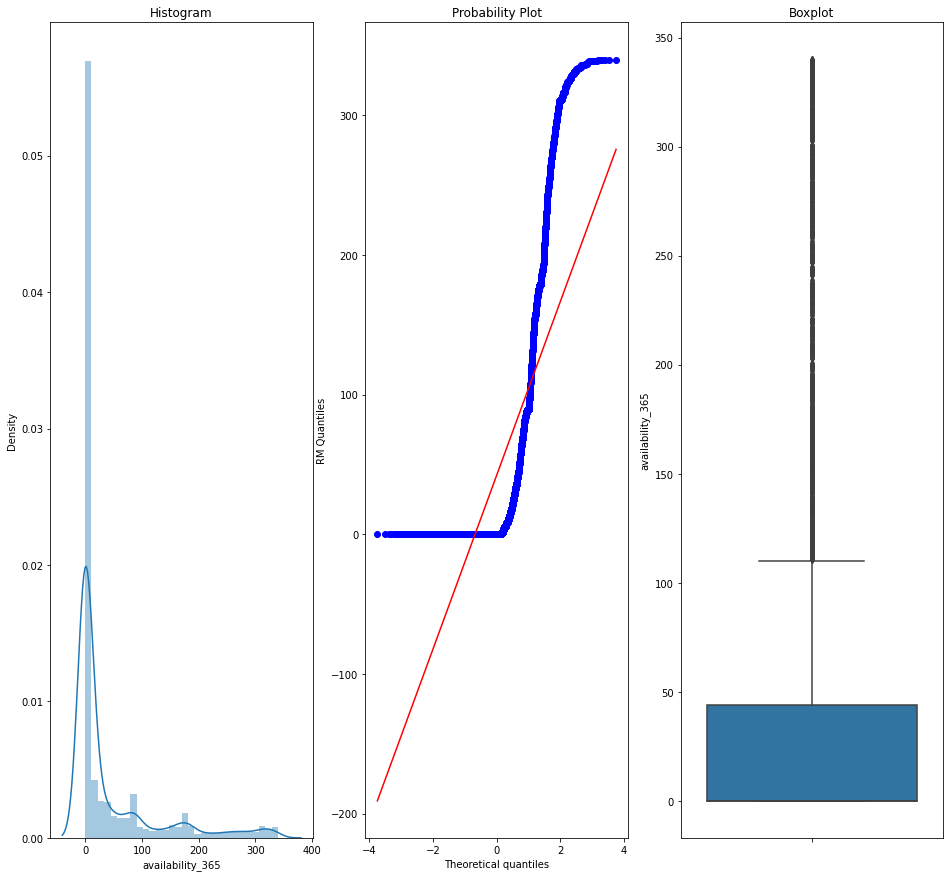

In [153]:
dig_plot(df3,'availability_365')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


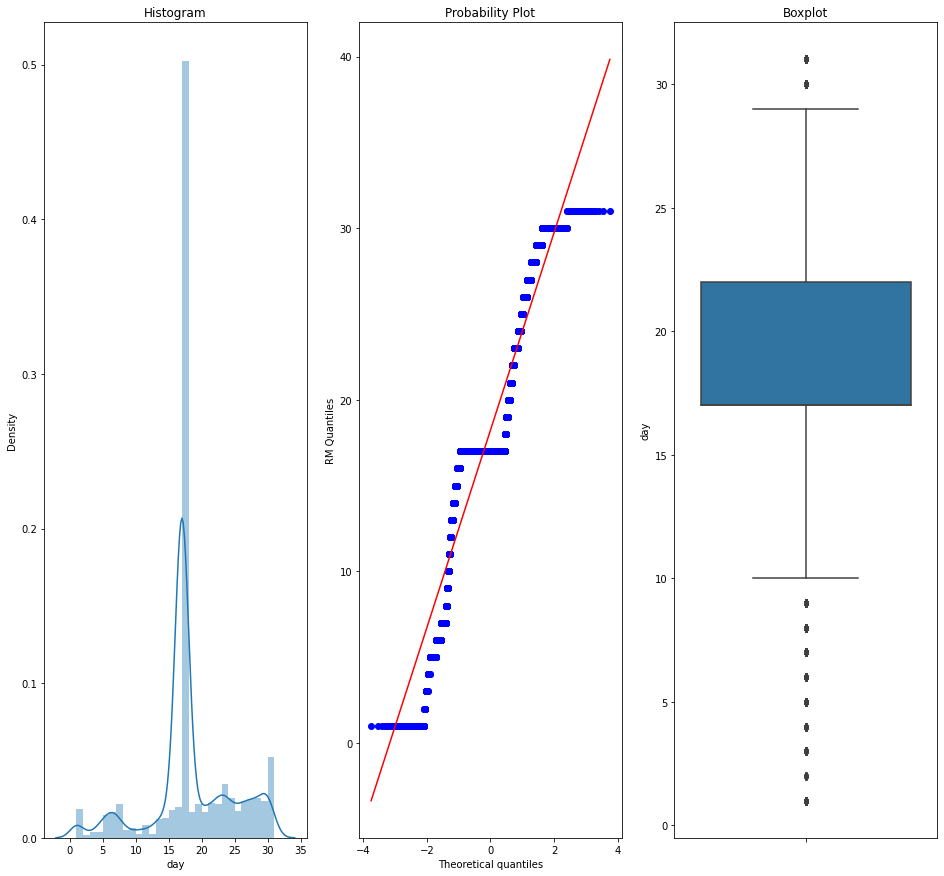

In [154]:
dig_plot(df3,'day')

In [155]:
df3.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
count,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000
mean,40.714465,-73.962230,114.929950,2.884699,5.208488,0.742597,1.137799,42.471686,2018.817845,5.626103,18.229835,3.219098
std,0.040566,0.025435,51.958453,1.798889,8.220956,0.420913,0.344711,80.274795,0.508359,0.667520,6.159152,1.625138
min,40.581010,-74.039420,0.000000,1.000000,0.000000,0.030000,1.000000,0.000000,2017.000000,4.000000,1.000000,0.000000
25%,40.686830,-73.983885,70.000000,1.000000,0.000000,0.590000,1.000000,0.000000,2019.000000,5.000000,17.000000,3.000000
50%,40.713340,-73.959300,103.000000,2.000000,1.000000,0.720000,1.000000,0.000000,2019.000000,6.000000,17.000000,3.000000
75%,40.742575,-73.944120,150.000000,4.000000,7.000000,0.720000,1.000000,44.000000,2019.000000,6.000000,22.000000,4.000000
max,40.799620,-73.912880,228.000000,7.000000,35.000000,2.230000,2.000000,340.000000,2019.000000,6.000000,31.000000,6.000000


In [156]:
df3.corr()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
latitude,1.000000,-0.034353,0.272392,0.000502,-0.008731,0.006625,-0.054594,-0.059441,-0.003727,0.017155,-0.004056,0.019442
longitude,-0.034353,1.000000,-0.337969,-0.016180,-0.010525,0.013436,0.052308,0.044078,0.007494,0.006708,0.001667,-0.029744
price,0.272392,-0.337969,1.000000,0.018118,0.036656,0.032927,-0.107022,0.059976,0.043852,0.003771,0.008037,0.013682
minimum_nights,0.000502,-0.016180,0.018118,1.000000,0.019019,-0.090986,-0.029215,0.027976,0.002754,-0.071147,-0.007370,-0.022931
number_of_reviews,-0.008731,-0.010525,0.036656,0.019019,1.000000,0.259721,0.097907,0.240050,-0.073660,-0.245622,0.168626,0.083133
reviews_per_month,0.006625,0.013436,0.032927,-0.090986,0.259721,1.000000,0.049959,0.180606,0.442030,0.253515,0.157014,0.087091
calculated_host_listings_count,-0.054594,0.052308,-0.107022,-0.029215,0.097907,0.049959,1.000000,0.156175,0.025799,-0.042747,0.026148,0.034645
availability_365,-0.059441,0.044078,0.059976,0.027976,0.240050,0.180606,0.156175,1.000000,0.124545,-0.037628,0.096172,0.043287
year,-0.003727,0.007494,0.043852,0.002754,-0.073660,0.442030,0.025799,0.124545,1.000000,0.345926,0.070250,0.006997
month,0.017155,0.006708,0.003771,-0.071147,-0.245622,0.253515,-0.042747,-0.037628,0.345926,1.000000,0.028865,0.019193


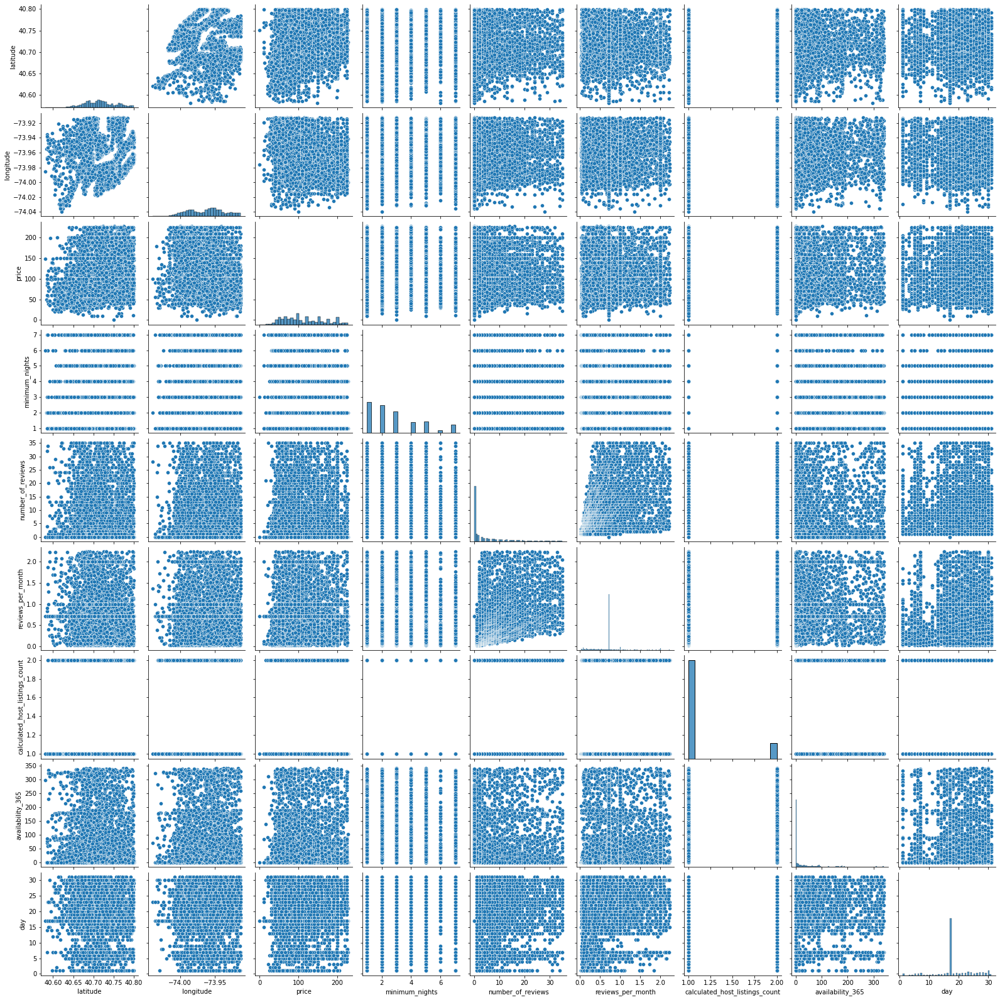

In [157]:
sns.pairplot(df3[continuous])

In [158]:
df4=df.copy()

In [159]:
def find_boundaries(d,var):
    lower_boud=d[var].quantile(0.05)
    upper_boud=d[var].quantile(0.95)
    return lower_boud,upper_boud

In [161]:
lat_upper,lat_lower=find_boundaries(df4,'latitude')
lat_upper,lat_lower

(40.646114000000004, 40.825643)

In [162]:
lon_upper,lon_lower=find_boundaries(df4,'longitude')
lon_upper,lon_lower

(-74.00388, -73.865771)

In [163]:
min_nig_upper,min_nig_lower=find_boundaries(df4,'minimum_nights')
min_nig_upper,min_nig_lower

(1.0, 30.0)

In [164]:
no_rev_upper,no_rev_lower=find_boundaries(df4,'number_of_reviews')
no_rev_upper,no_rev_lower

(0.0, 114.0)

In [165]:
rev_permon_upper,re_permon_lower=find_boundaries(df4,'reviews_per_month')
rev_permon_upper,re_permon_lower

(0.05, 4.31)

In [166]:
cal_host_upper,cal_host_lower=find_boundaries(df4,'calculated_host_listings_count')
cal_host_upper,cal_host_lower

(1.0, 15.0)

In [167]:
avail_upper,avail_lower=find_boundaries(df4,'availability_365')
avail_upper,avail_lower

(0.0, 359.0)

In [168]:
year_upper,year_lower=find_boundaries(df4,'day')
year_upper,year_lower

(2.0, 30.0)

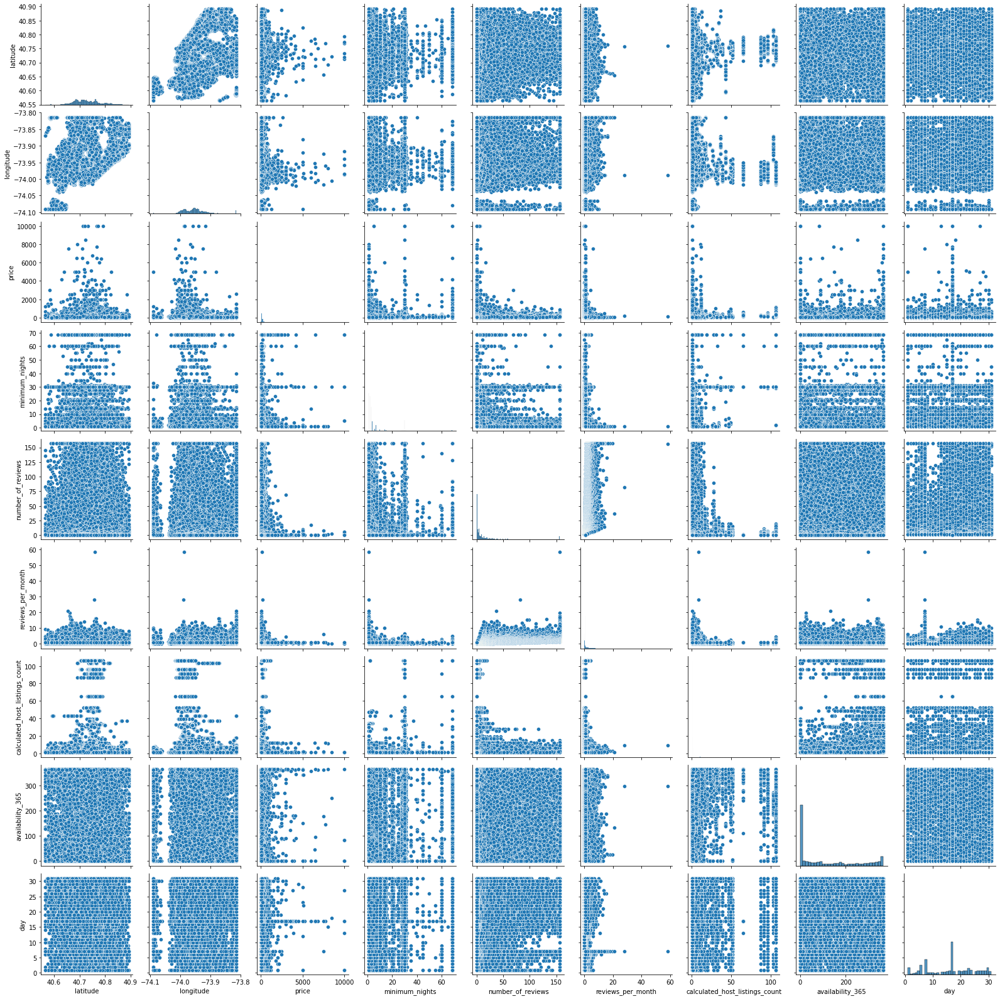

In [141]:
sns.pairplot(df2[continuous])

In [142]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

latitude                            0.073015
longitude                           0.046795
price                             106.000000
minimum_nights                      4.000000
number_of_reviews                  23.000000
reviews_per_month                   1.300000
calculated_host_listings_count      1.000000
availability_365                  227.000000
year                                1.000000
month                               1.000000
day                                16.000000
week_day                            3.000000
dtype: float64


In [143]:
df3=df.copy

In [144]:
df3= df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q1 + 1.5 * IQR))).any(axis=1)]
print(df3.shape)

(7823, 15)


C:\Users\899164\AppData\Local\Temp\3\ipykernel_19792\3919138846.py:1: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version.  Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  df3= df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q1 + 1.5 * IQR))).any(axis=1)]


In [145]:
df3.head(5)

,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
19,Manhattan,East Harlem,40.79685,-73.94872,Entire home/apt,190,7,0,0.72,2,249,2019.0,6.0,17.0,3.0
25,Brooklyn,Windsor Terrace,40.65599,-73.97519,Private room,60,1,19,1.37,2,85,2019.0,6.0,23.0,6.0
56,Manhattan,Lower East Side,40.72004,-73.99104,Private room,110,5,19,0.17,1,301,2019.0,5.0,18.0,5.0
83,Brooklyn,Flatbush,40.65401,-73.96323,Entire home/apt,130,6,16,0.15,1,38,2019.0,6.0,15.0,5.0
90,Brooklyn,Bushwick,40.70032,-73.93830,Private room,65,4,24,0.28,1,317,2019.0,5.0,26.0,6.0


In [146]:
df3.corr()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
latitude,1.000000,-0.034353,0.272392,0.000502,-0.008731,0.006625,-0.054594,-0.059441,-0.003727,0.017155,-0.004056,0.019442
longitude,-0.034353,1.000000,-0.337969,-0.016180,-0.010525,0.013436,0.052308,0.044078,0.007494,0.006708,0.001667,-0.029744
price,0.272392,-0.337969,1.000000,0.018118,0.036656,0.032927,-0.107022,0.059976,0.043852,0.003771,0.008037,0.013682
minimum_nights,0.000502,-0.016180,0.018118,1.000000,0.019019,-0.090986,-0.029215,0.027976,0.002754,-0.071147,-0.007370,-0.022931
number_of_reviews,-0.008731,-0.010525,0.036656,0.019019,1.000000,0.259721,0.097907,0.240050,-0.073660,-0.245622,0.168626,0.083133
reviews_per_month,0.006625,0.013436,0.032927,-0.090986,0.259721,1.000000,0.049959,0.180606,0.442030,0.253515,0.157014,0.087091
calculated_host_listings_count,-0.054594,0.052308,-0.107022,-0.029215,0.097907,0.049959,1.000000,0.156175,0.025799,-0.042747,0.026148,0.034645
availability_365,-0.059441,0.044078,0.059976,0.027976,0.240050,0.180606,0.156175,1.000000,0.124545,-0.037628,0.096172,0.043287
year,-0.003727,0.007494,0.043852,0.002754,-0.073660,0.442030,0.025799,0.124545,1.000000,0.345926,0.070250,0.006997
month,0.017155,0.006708,0.003771,-0.071147,-0.245622,0.253515,-0.042747,-0.037628,0.345926,1.000000,0.028865,0.019193


In [147]:
df3.isnull().sum()

neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
year                              0
month                             0
day                               0
week_day                          0
dtype: int64

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


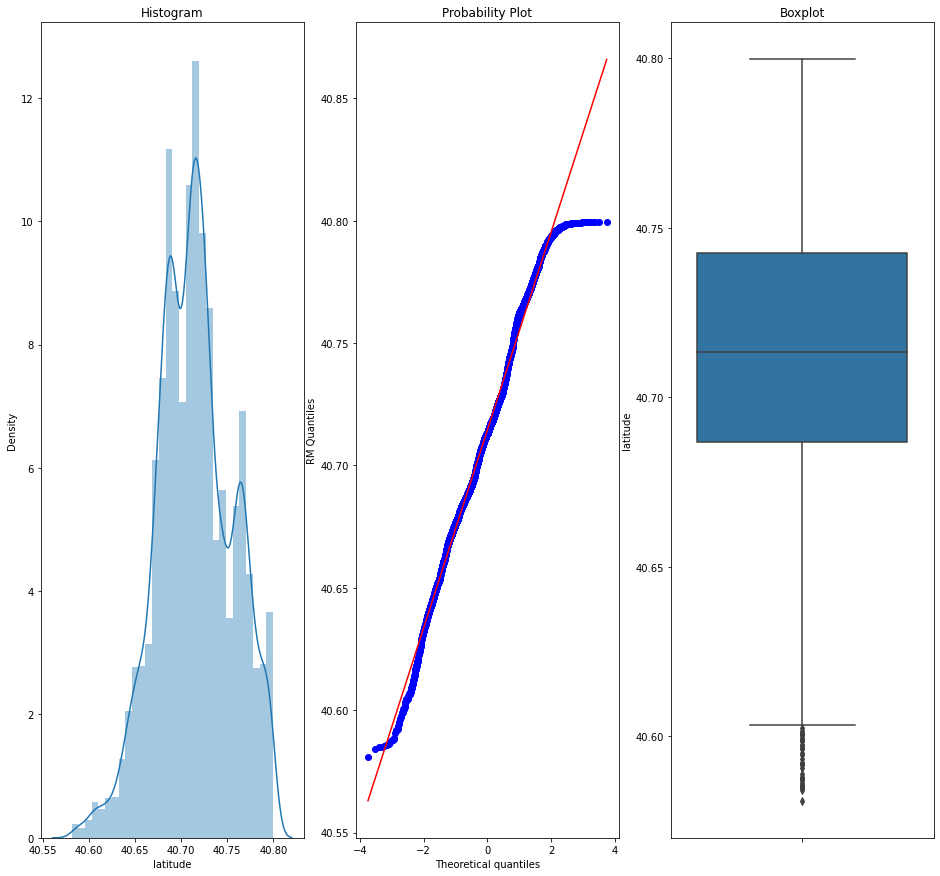

In [148]:
dig_plot(df3,'latitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


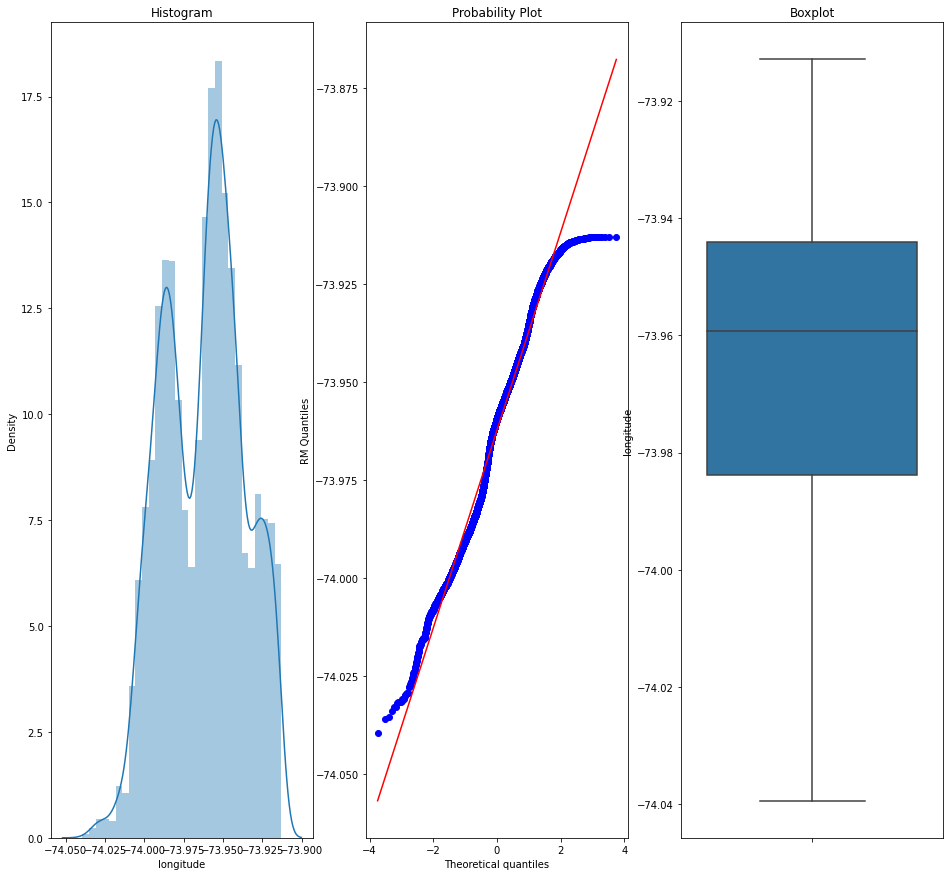

In [149]:
dig_plot(df3,'longitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


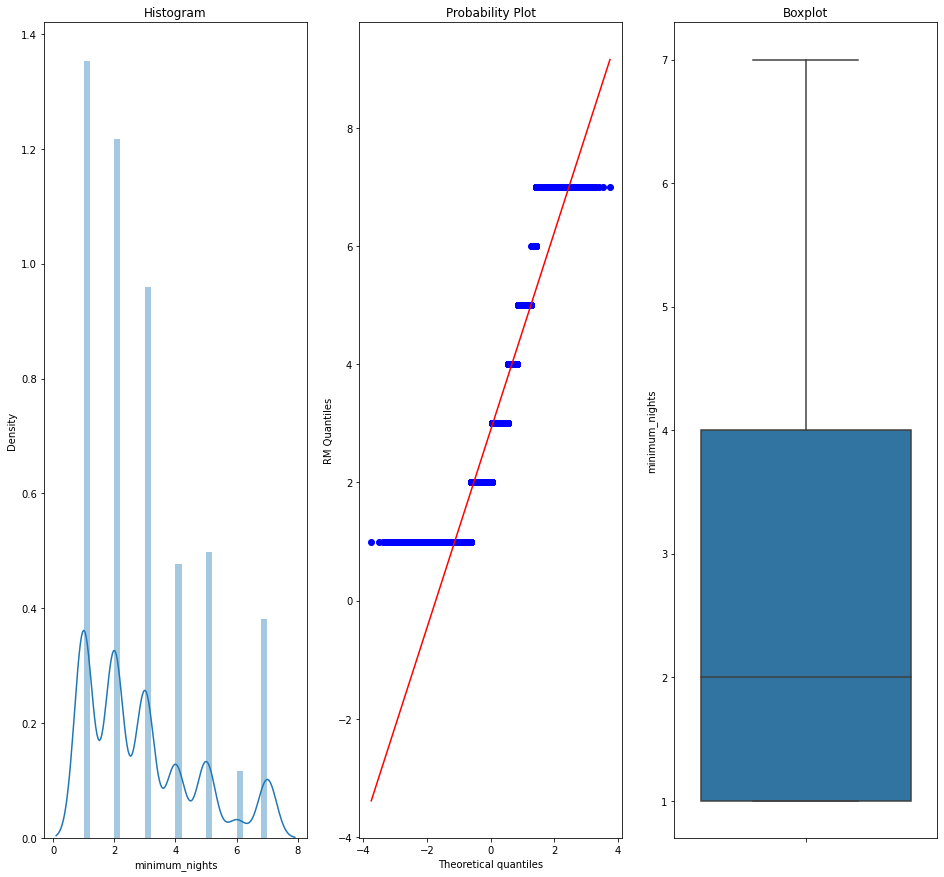

In [150]:
dig_plot(df3,'minimum_nights')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


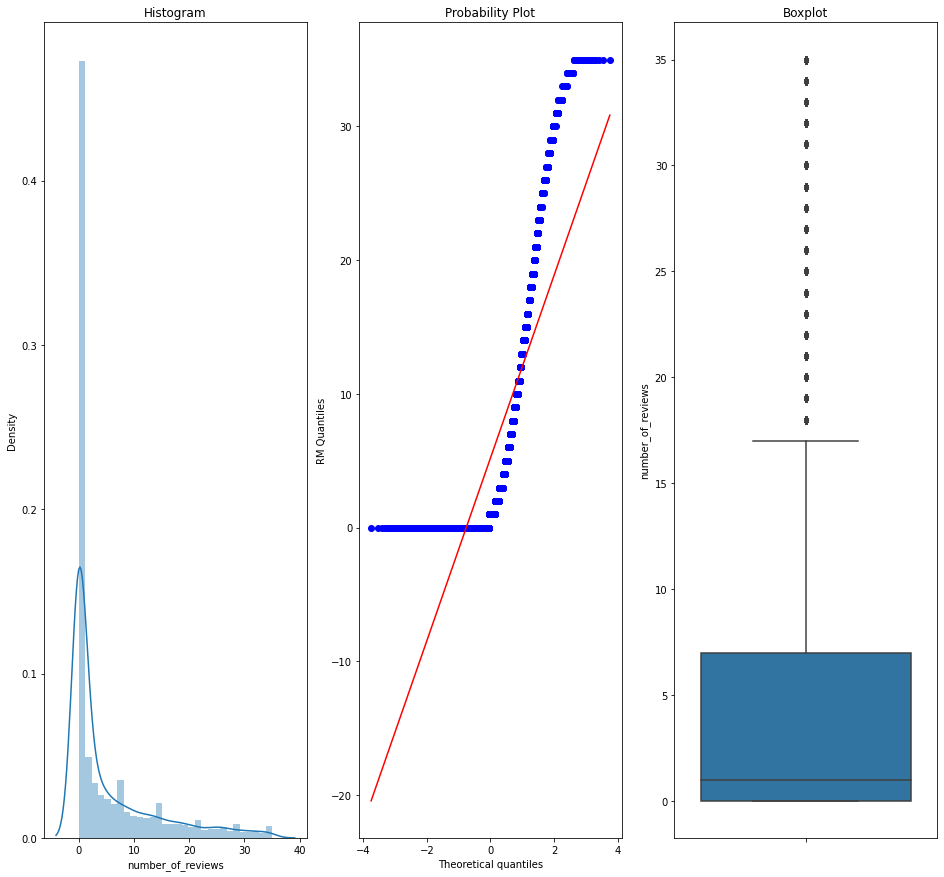

In [151]:
dig_plot(df3,'number_of_reviews')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


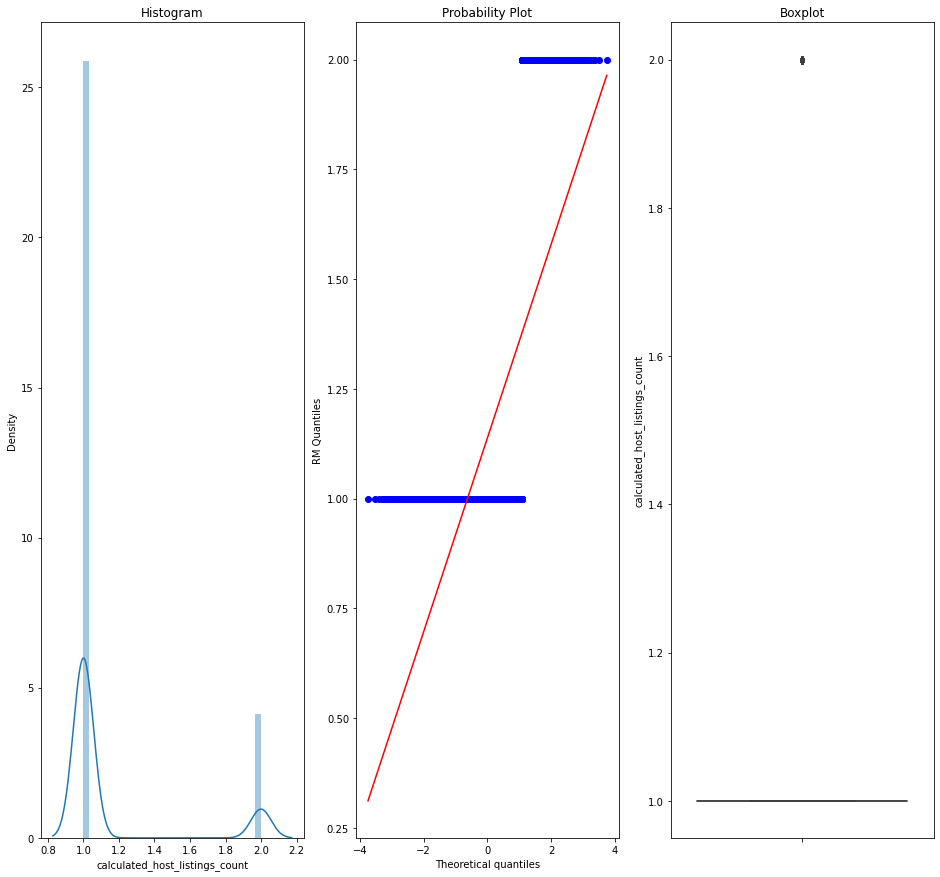

In [152]:
dig_plot(df3,'calculated_host_listings_count')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


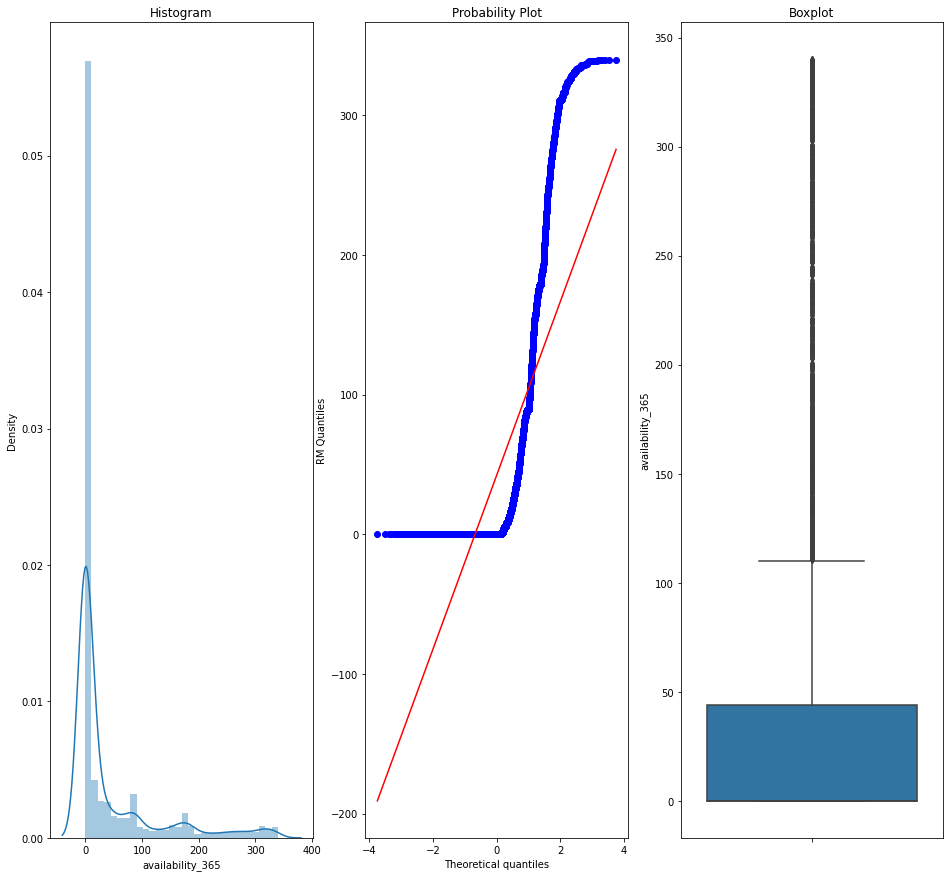

In [153]:
dig_plot(df3,'availability_365')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


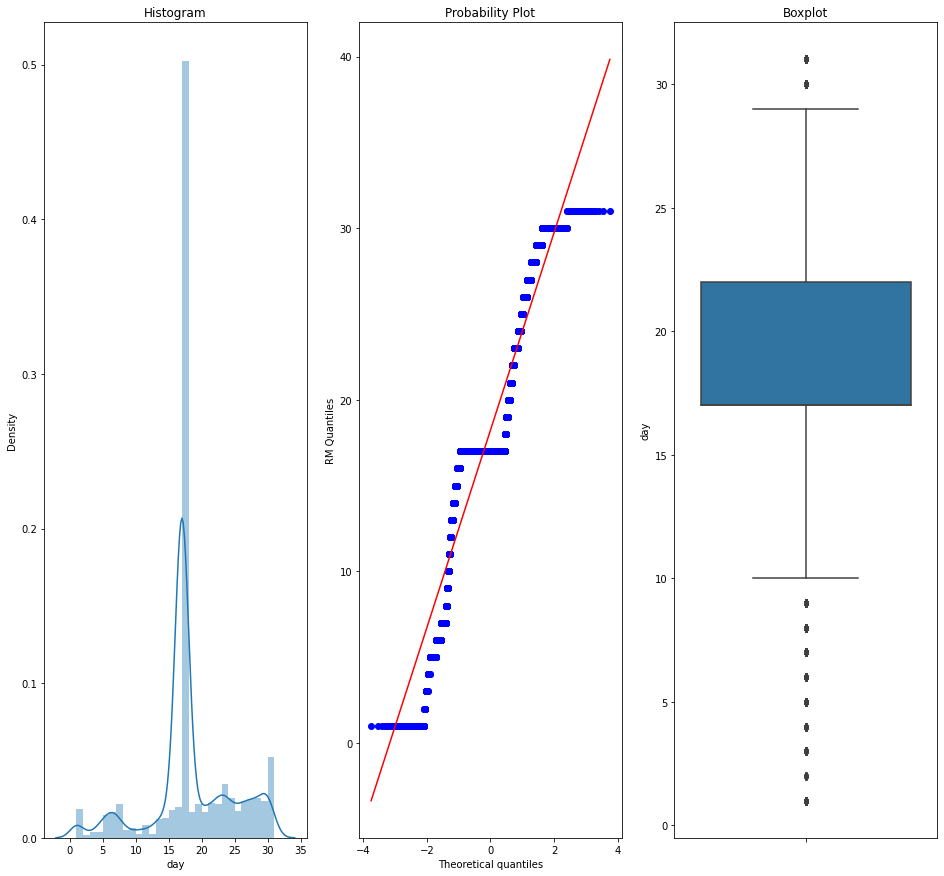

In [154]:
dig_plot(df3,'day')

In [155]:
df3.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
count,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000,7823.000000
mean,40.714465,-73.962230,114.929950,2.884699,5.208488,0.742597,1.137799,42.471686,2018.817845,5.626103,18.229835,3.219098
std,0.040566,0.025435,51.958453,1.798889,8.220956,0.420913,0.344711,80.274795,0.508359,0.667520,6.159152,1.625138
min,40.581010,-74.039420,0.000000,1.000000,0.000000,0.030000,1.000000,0.000000,2017.000000,4.000000,1.000000,0.000000
25%,40.686830,-73.983885,70.000000,1.000000,0.000000,0.590000,1.000000,0.000000,2019.000000,5.000000,17.000000,3.000000
50%,40.713340,-73.959300,103.000000,2.000000,1.000000,0.720000,1.000000,0.000000,2019.000000,6.000000,17.000000,3.000000
75%,40.742575,-73.944120,150.000000,4.000000,7.000000,0.720000,1.000000,44.000000,2019.000000,6.000000,22.000000,4.000000
max,40.799620,-73.912880,228.000000,7.000000,35.000000,2.230000,2.000000,340.000000,2019.000000,6.000000,31.000000,6.000000


In [156]:
df3.corr()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
latitude,1.000000,-0.034353,0.272392,0.000502,-0.008731,0.006625,-0.054594,-0.059441,-0.003727,0.017155,-0.004056,0.019442
longitude,-0.034353,1.000000,-0.337969,-0.016180,-0.010525,0.013436,0.052308,0.044078,0.007494,0.006708,0.001667,-0.029744
price,0.272392,-0.337969,1.000000,0.018118,0.036656,0.032927,-0.107022,0.059976,0.043852,0.003771,0.008037,0.013682
minimum_nights,0.000502,-0.016180,0.018118,1.000000,0.019019,-0.090986,-0.029215,0.027976,0.002754,-0.071147,-0.007370,-0.022931
number_of_reviews,-0.008731,-0.010525,0.036656,0.019019,1.000000,0.259721,0.097907,0.240050,-0.073660,-0.245622,0.168626,0.083133
reviews_per_month,0.006625,0.013436,0.032927,-0.090986,0.259721,1.000000,0.049959,0.180606,0.442030,0.253515,0.157014,0.087091
calculated_host_listings_count,-0.054594,0.052308,-0.107022,-0.029215,0.097907,0.049959,1.000000,0.156175,0.025799,-0.042747,0.026148,0.034645
availability_365,-0.059441,0.044078,0.059976,0.027976,0.240050,0.180606,0.156175,1.000000,0.124545,-0.037628,0.096172,0.043287
year,-0.003727,0.007494,0.043852,0.002754,-0.073660,0.442030,0.025799,0.124545,1.000000,0.345926,0.070250,0.006997
month,0.017155,0.006708,0.003771,-0.071147,-0.245622,0.253515,-0.042747,-0.037628,0.345926,1.000000,0.028865,0.019193


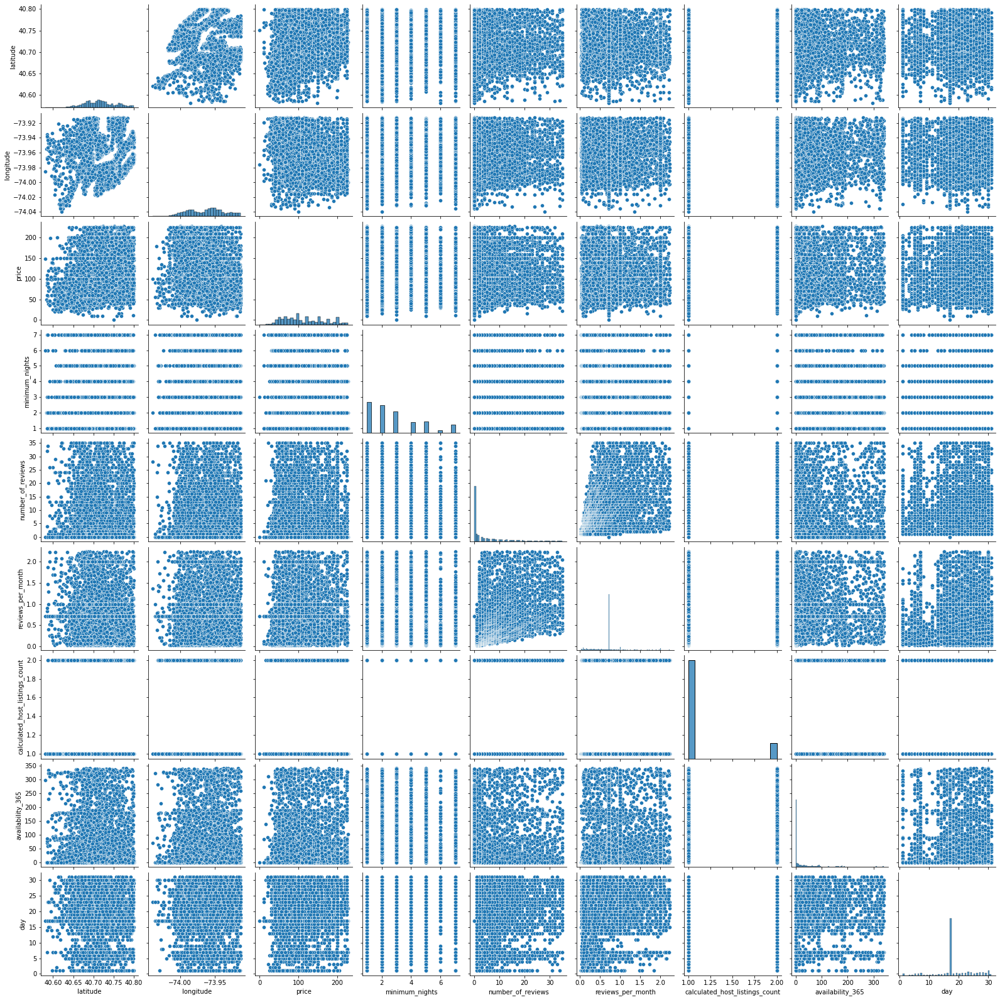

In [157]:
sns.pairplot(df3[continuous])

In [158]:
df4=df.copy()

In [159]:
def find_boundaries(d,var):
    lower_boud=d[var].quantile(0.05)
    upper_boud=d[var].quantile(0.95)
    return lower_boud,upper_boud

In [161]:
lat_upper,lat_lower=find_boundaries(df4,'latitude')
lat_upper,lat_lower

(40.646114000000004, 40.825643)

In [162]:
lon_upper,lon_lower=find_boundaries(df4,'longitude')
lon_upper,lon_lower

(-74.00388, -73.865771)

In [163]:
min_nig_upper,min_nig_lower=find_boundaries(df4,'minimum_nights')
min_nig_upper,min_nig_lower

(1.0, 30.0)

In [164]:
no_rev_upper,no_rev_lower=find_boundaries(df4,'number_of_reviews')
no_rev_upper,no_rev_lower

(0.0, 114.0)

In [165]:
rev_permon_upper,re_permon_lower=find_boundaries(df4,'reviews_per_month')
rev_permon_upper,re_permon_lower

(0.05, 4.31)

In [166]:
cal_host_upper,cal_host_lower=find_boundaries(df4,'calculated_host_listings_count')
cal_host_upper,cal_host_lower

(1.0, 15.0)

In [167]:
avail_upper,avail_lower=find_boundaries(df4,'availability_365')
avail_upper,avail_lower

(0.0, 359.0)

In [168]:
year_upper,year_lower=find_boundaries(df4,'day')
year_upper,year_lower

(2.0, 30.0)

In [178]:
df4['latitude']=np.where(df4['latitude']>lat_upper,lat_upper,np.where(df4['latitude']<lat_lower,lat_lower,df4['latitude']))
df4['longitude']=np.where(df4['longitude']>lon_upper,lon_upper,np.where(df4['longitude']<lon_lower,lon_lower,df4['longitude']))
df4['minimum_nights']=np.where(df4['minimum_nights']>min_nig_upper,min_nig_upper,np.where(df4['minimum_nights']<min_nig_lower,min_nig_lower,df4['minimum_nights']))
df4['number_of_reviews']=np.where(df4['number_of_reviews']>no_rev_upper,no_rev_upper,np.where(df4['number_of_reviews']<no_rev_lower,no_rev_lower,df4['number_of_reviews']))
df4['calculated_host_listings_count']=np.where(df4['calculated_host_listings_count']>cal_host_upper,cal_host_upper,np.where(df4['calculated_host_listings_count']<cal_host_lower,cal_host_lower,df4['calculated_host_listings_count']))
df4['availability_365']=np.where(df4['availability_365']>avail_upper,avail_upper,np.where(df4['availability_365']<avail_lower,avail_lower,df4['availability_365']))
df4['day']=np.where(df4['day']>year_upper,year_upper,np.where(df4['day']<year_lower,year_lower,df4['day']))
                                

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


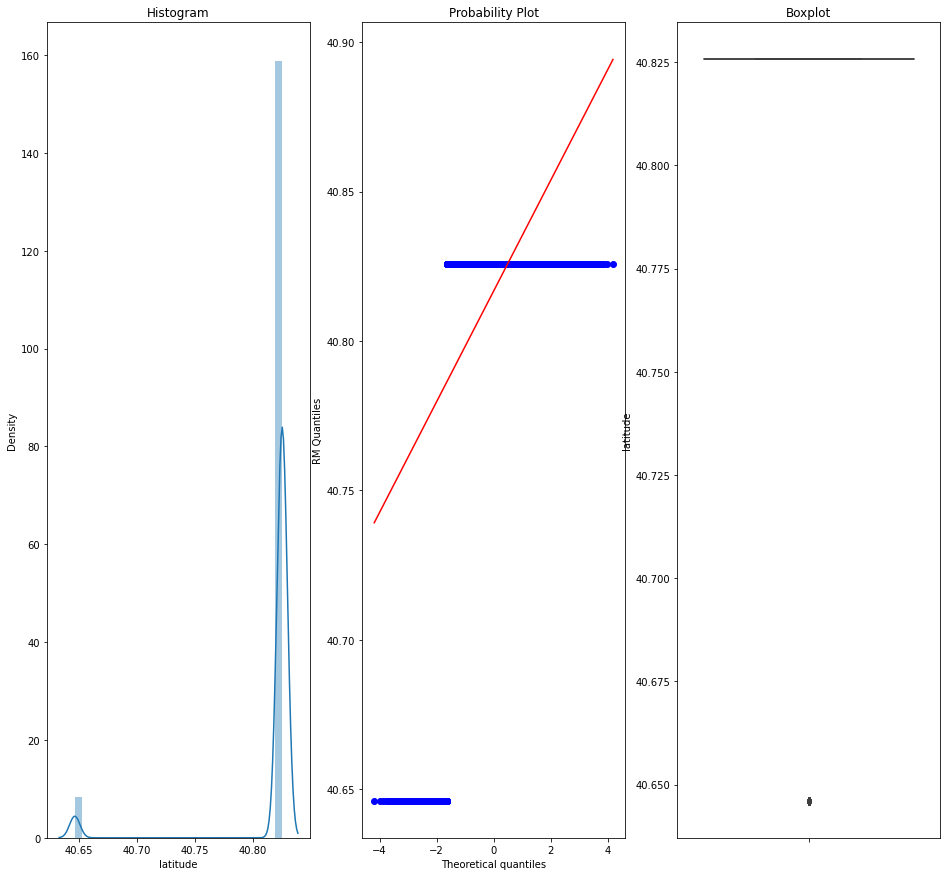

In [179]:
dig_plot(df4,'latitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


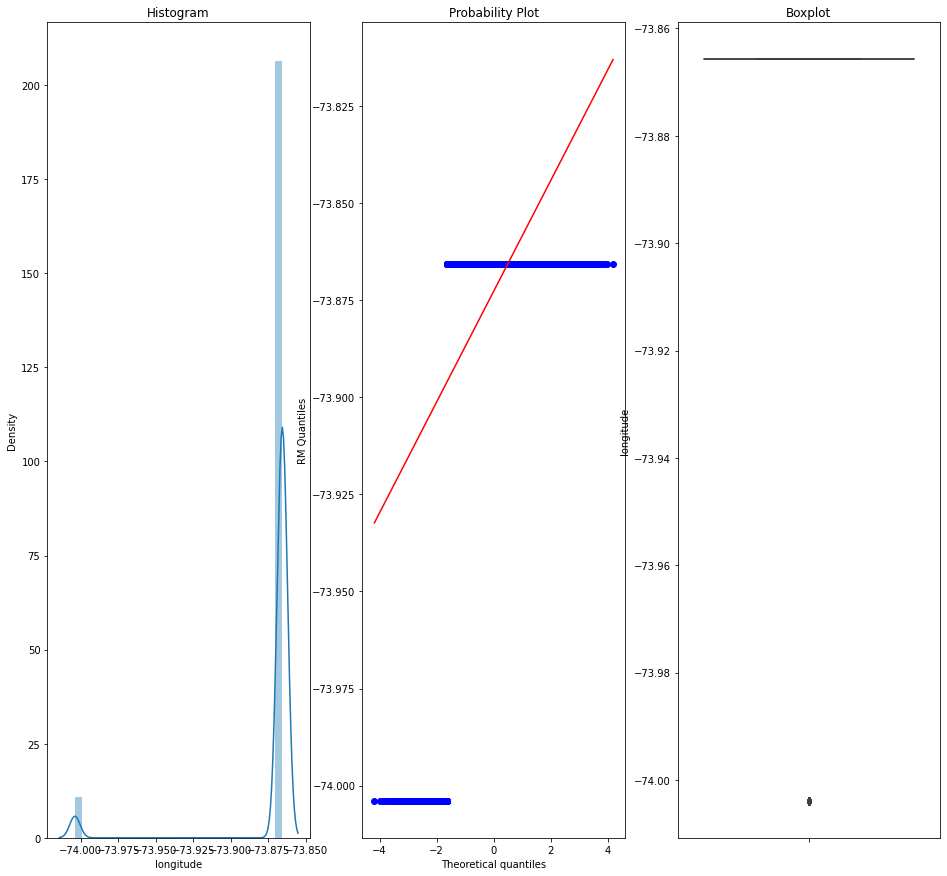

In [180]:
dig_plot(df4,'longitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


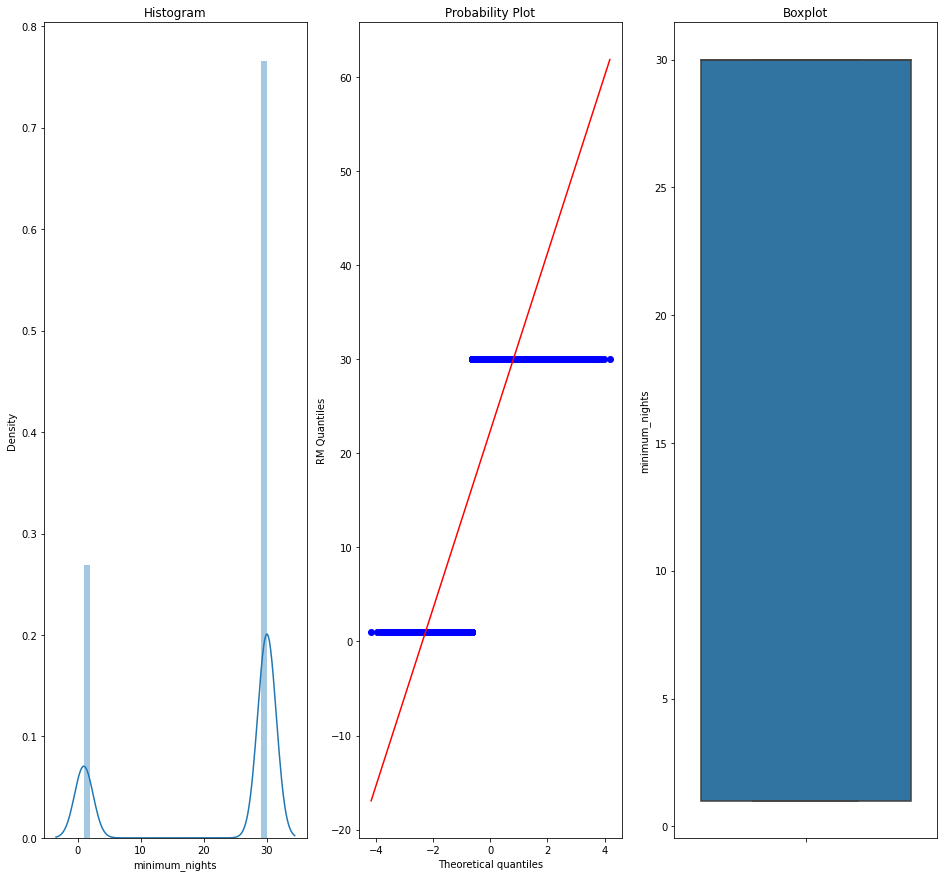

In [181]:
dig_plot(df4,'minimum_nights')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


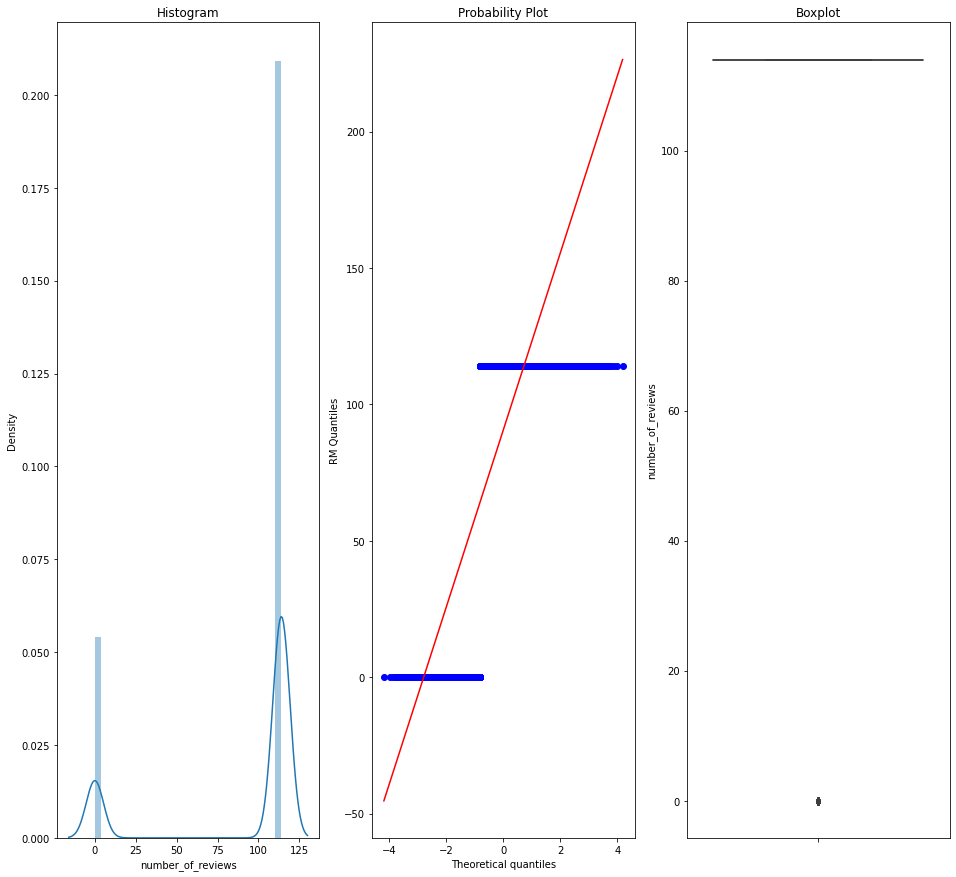

In [182]:
dig_plot(df4,'number_of_reviews')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


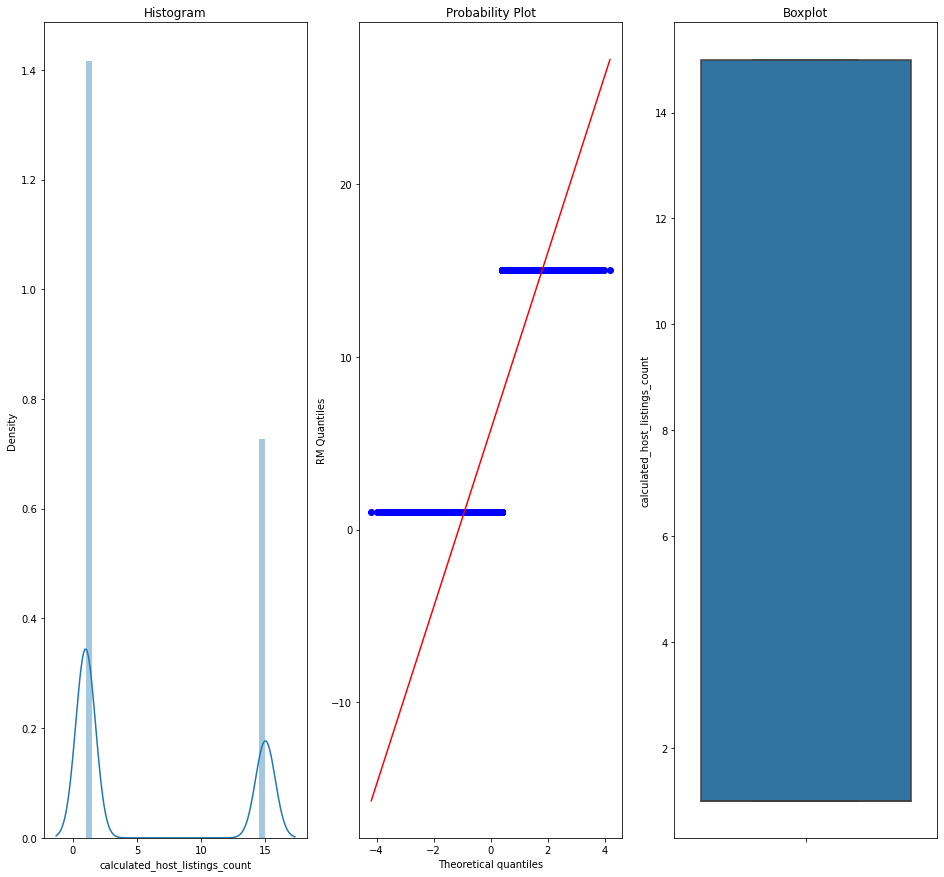

In [183]:
dig_plot(df4,'calculated_host_listings_count')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


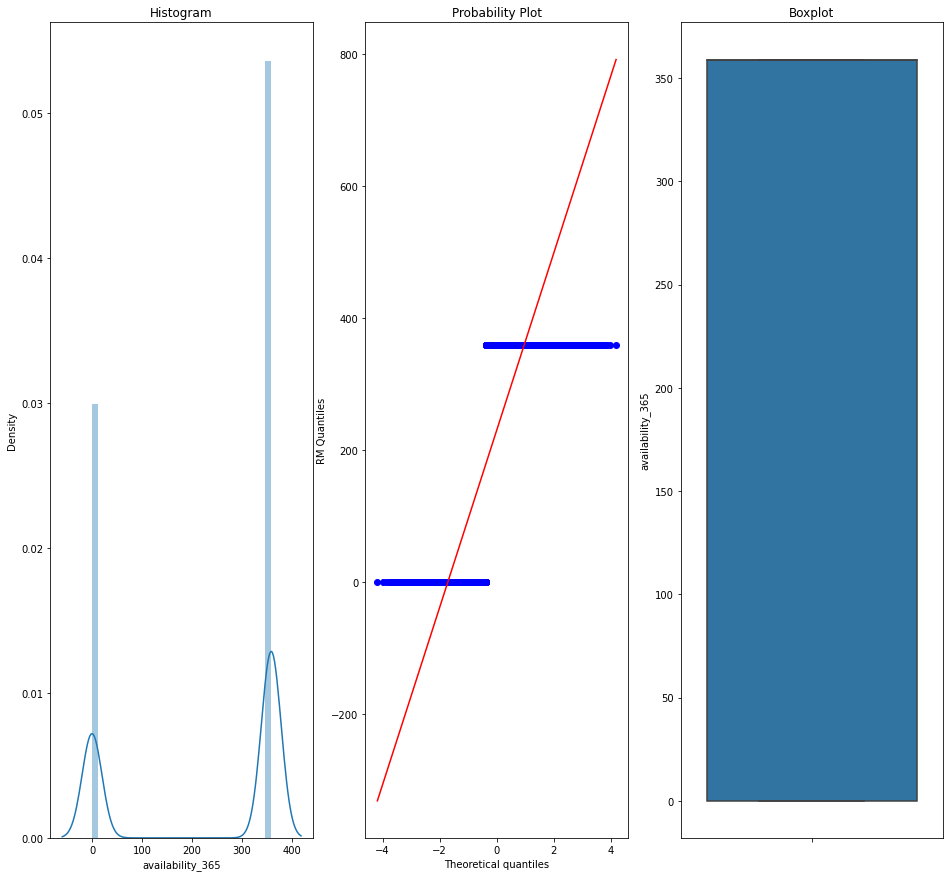

In [184]:
dig_plot(df4,'availability_365')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


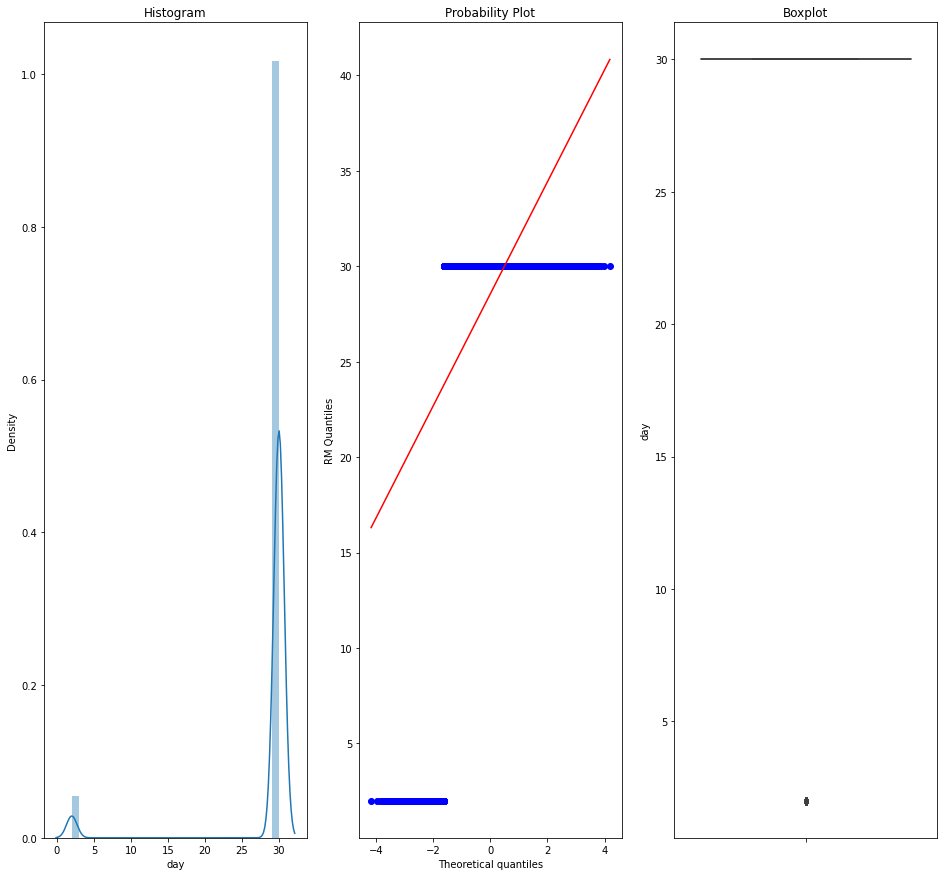

In [185]:
dig_plot(df4,'day')

In [186]:
df4.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,40.816666,-73.872680,152.720687,22.455670,90.563493,1.238930,5.750752,230.268085,2018.434155,5.848819,28.574660,3.193885
std,0.039130,0.030108,240.154170,12.722891,46.070981,1.520861,6.628860,172.172756,1.091414,2.571219,6.154567,1.943342
min,40.646114,-74.003880,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,2011.000000,1.000000,2.000000,0.000000
25%,40.825643,-73.865771,69.000000,1.000000,114.000000,0.280000,1.000000,0.000000,2018.000000,5.000000,30.000000,2.000000
50%,40.825643,-73.865771,106.000000,30.000000,114.000000,0.720000,1.000000,359.000000,2019.000000,6.000000,30.000000,3.000000
75%,40.825643,-73.865771,175.000000,30.000000,114.000000,1.580000,15.000000,359.000000,2019.000000,6.000000,30.000000,5.000000
max,40.825643,-73.865771,10000.000000,30.000000,114.000000,58.500000,15.000000,359.000000,2019.000000,12.000000,30.000000,6.000000


In [187]:
df4.corr()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
latitude,1.000000,0.265449,0.043916,0.031855,-0.009903,-0.022236,-0.041879,-0.068039,-0.042601,0.005889,-0.009163,-0.009317
longitude,0.265449,1.000000,-0.068326,-0.012686,0.028355,0.009007,-0.025159,-0.034057,-0.023214,0.000956,-0.010890,-0.003706
price,0.043916,-0.068326,1.000000,0.026415,-0.085151,-0.036814,-0.034611,0.051959,0.010729,0.002384,0.000304,-0.004629
minimum_nights,0.031855,-0.012686,0.026415,1.000000,0.024914,-0.204594,-0.057755,0.040321,0.007879,0.003589,-0.033618,-0.034179
number_of_reviews,-0.009903,0.028355,-0.085151,0.024914,1.000000,0.173578,0.033245,0.130903,-0.263744,-0.029911,-0.117814,0.050754
reviews_per_month,-0.022236,0.009007,-0.036814,-0.204594,0.173578,1.000000,0.119152,0.343147,0.356997,-0.102948,0.133684,0.059062
calculated_host_listings_count,-0.041879,-0.025159,-0.034611,-0.057755,0.033245,0.119152,1.000000,0.299619,0.167510,-0.032114,0.047677,0.022162
availability_365,-0.068039,-0.034057,0.051959,0.040321,0.130903,0.343147,0.299619,1.000000,0.440831,-0.099575,0.129308,0.050568
year,-0.042601,-0.023214,0.010729,0.007879,-0.263744,0.356997,0.167510,0.440831,1.000000,-0.228896,0.083175,0.039239
month,0.005889,0.000956,0.002384,0.003589,-0.029911,-0.102948,-0.032114,-0.099575,-0.228896,1.000000,0.223813,0.121628


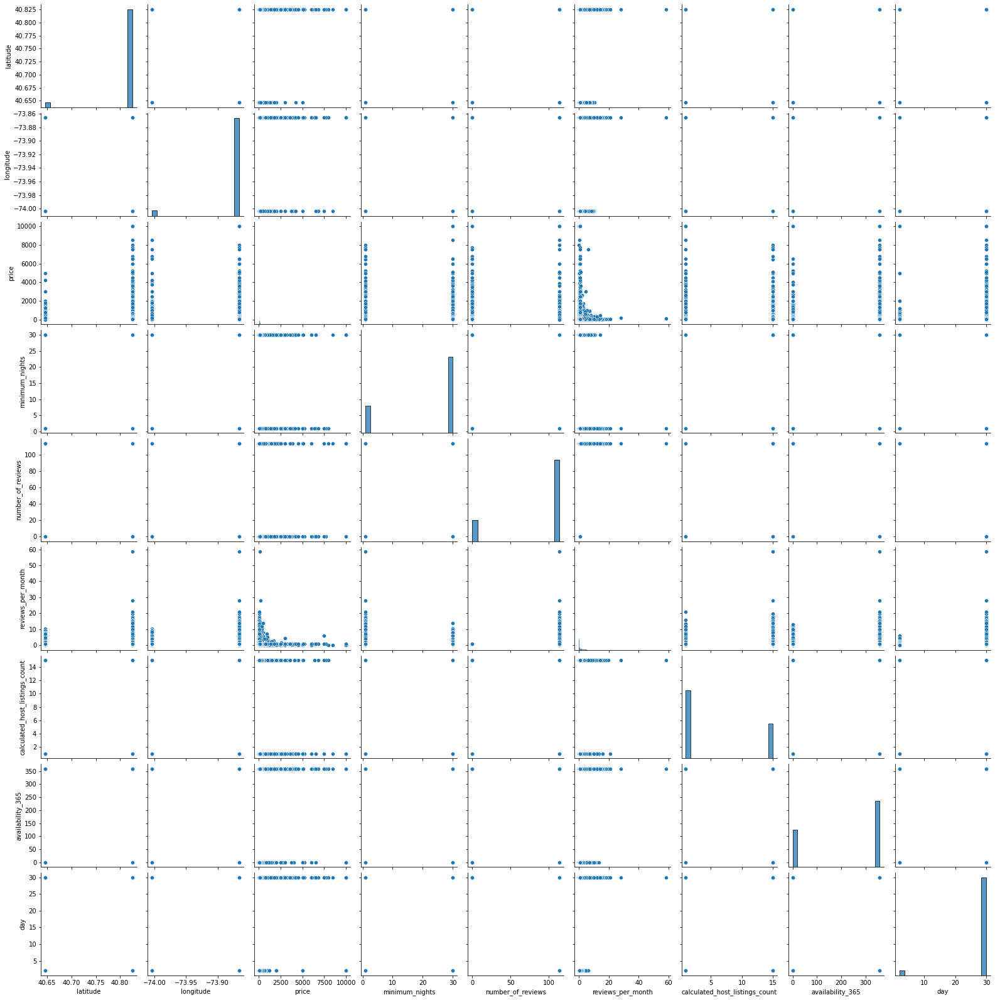

In [188]:
sns.pairplot(df4[continuous])

In [189]:
import feature_engine
from feature_engine.outliers import Winsorizer

In [190]:
df.columns

Index(['neighbourhood_group', 'neighbourhood', 'latitude', 'longitude',
       'room_type', 'price', 'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'year', 'month', 'day', 'week_day'],
      dtype='object')

In [191]:
winsorizer=Winsorizer(tail='both',fold=3,variables=['latitude','longitude',
       'price', 'minimum_nights', 'number_of_reviews',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365','day'])

In [192]:
df5=df.copy()

In [193]:
winsorizer.fit(df5)

Winsorizer(tail='both',
           variables=['latitude', 'longitude', 'price', 'minimum_nights',
                      'number_of_reviews', 'reviews_per_month',
                      'calculated_host_listings_count', 'availability_365',
                      'day'])

In [194]:
df5_t=winsorizer.transform(df5)

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


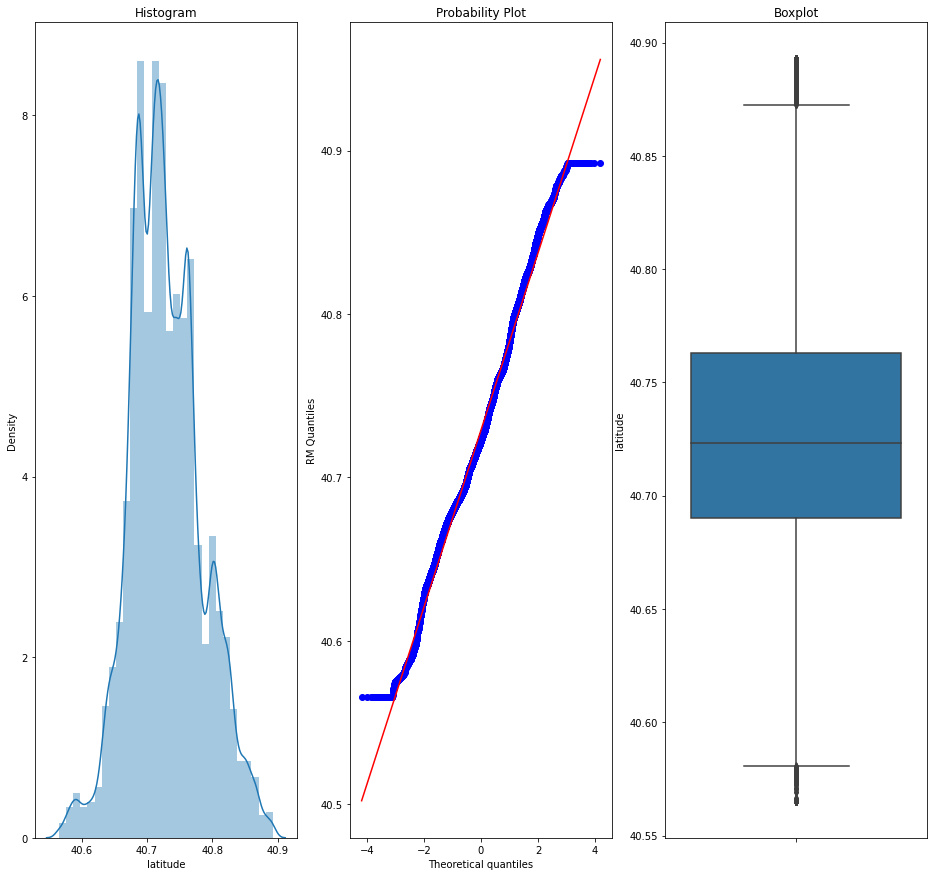

In [195]:
dig_plot(df5_t,'latitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


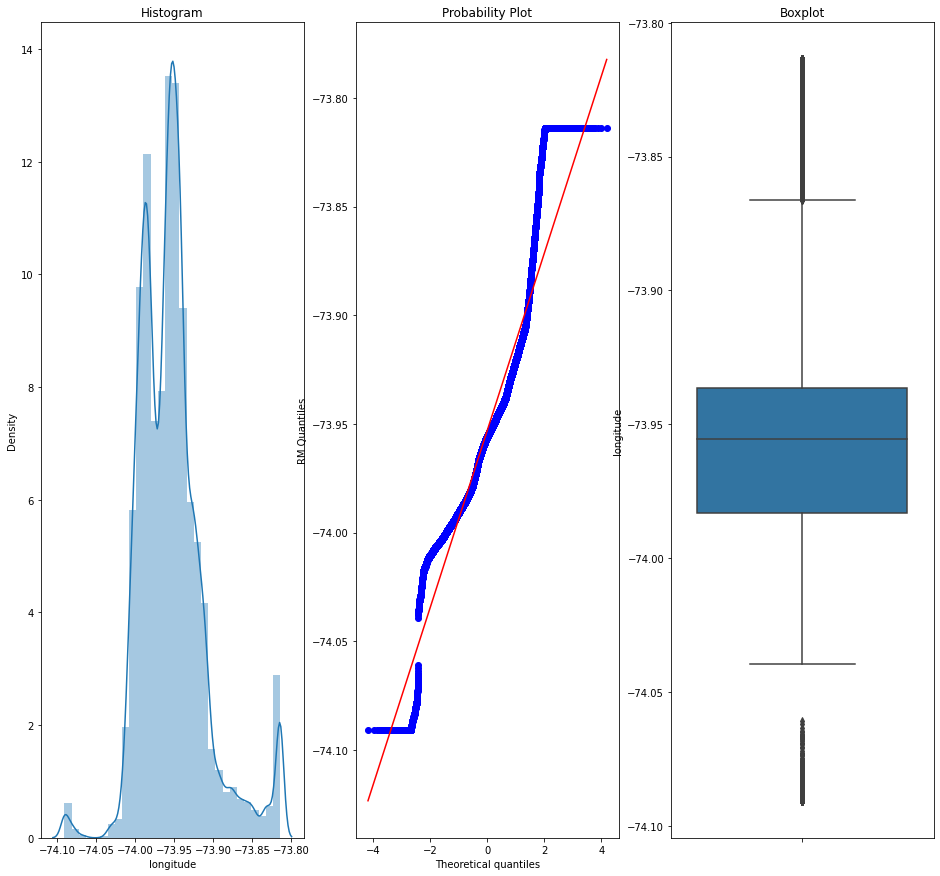

In [196]:
dig_plot(df5_t,'longitude')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


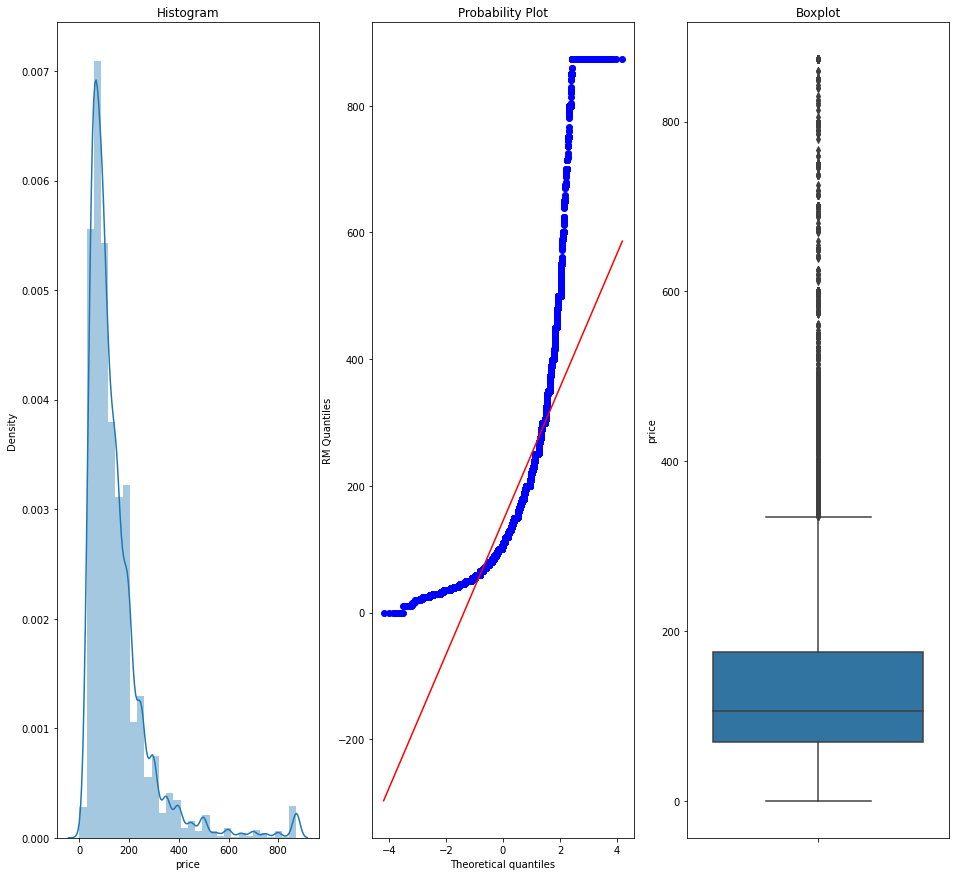

In [197]:
dig_plot(df5_t,'price')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


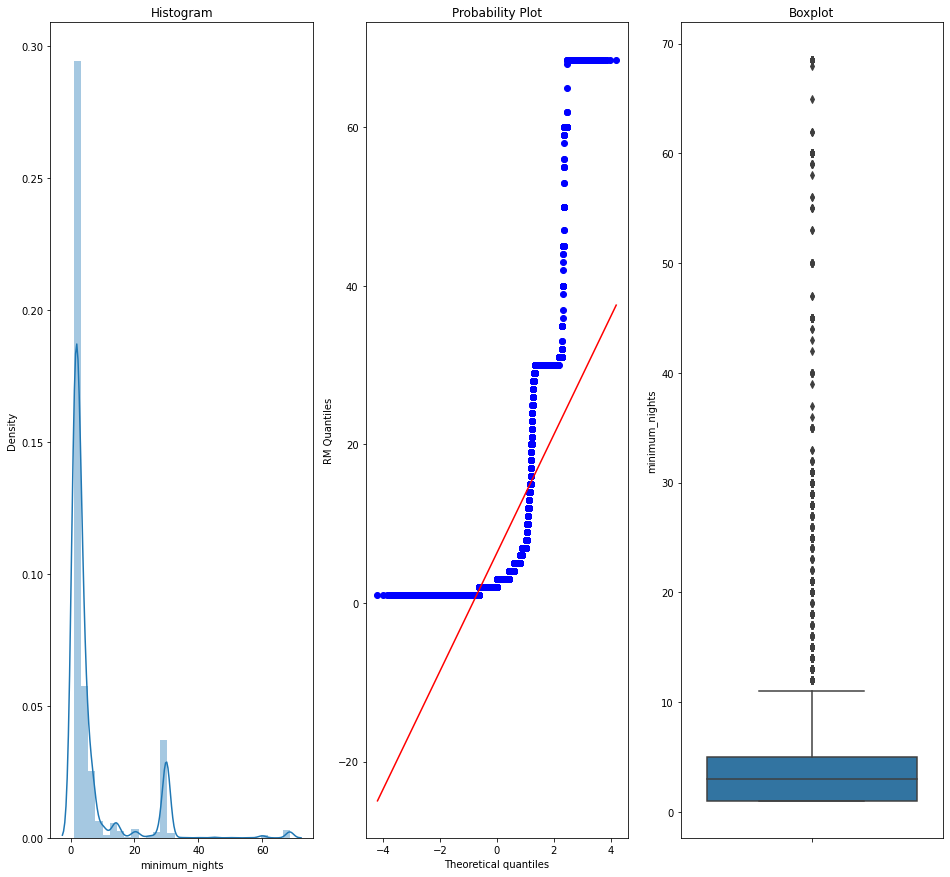

In [198]:
dig_plot(df5_t,'minimum_nights')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


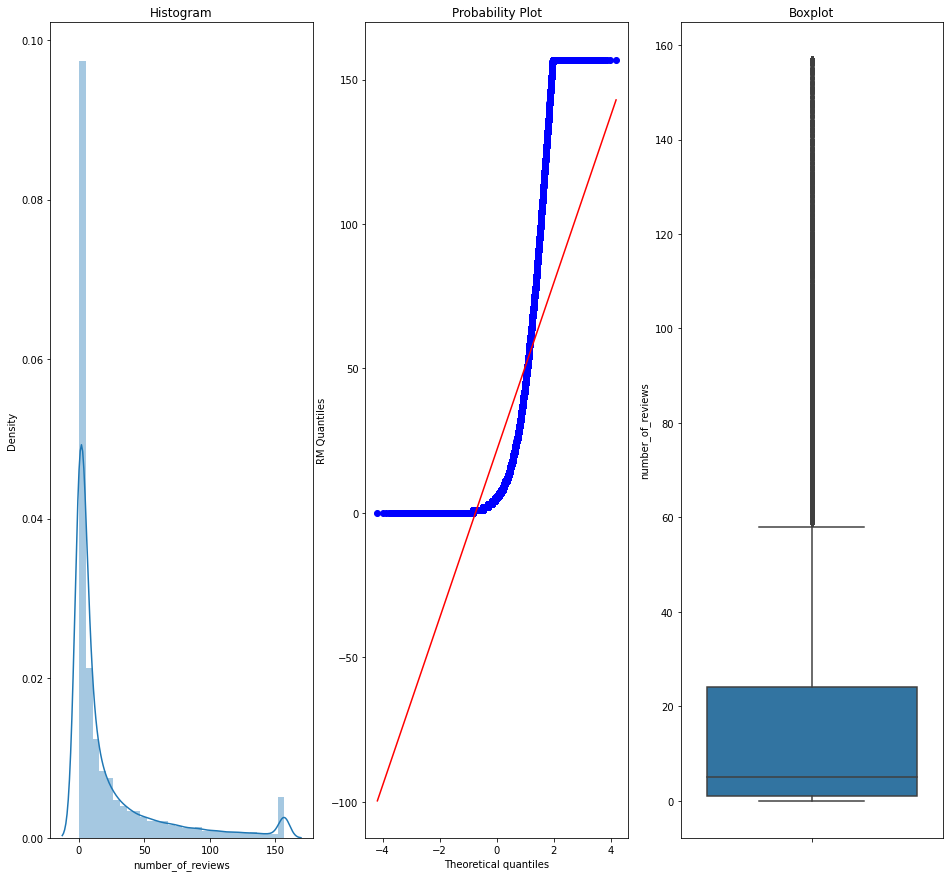

In [199]:
dig_plot(df5_t,'number_of_reviews')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


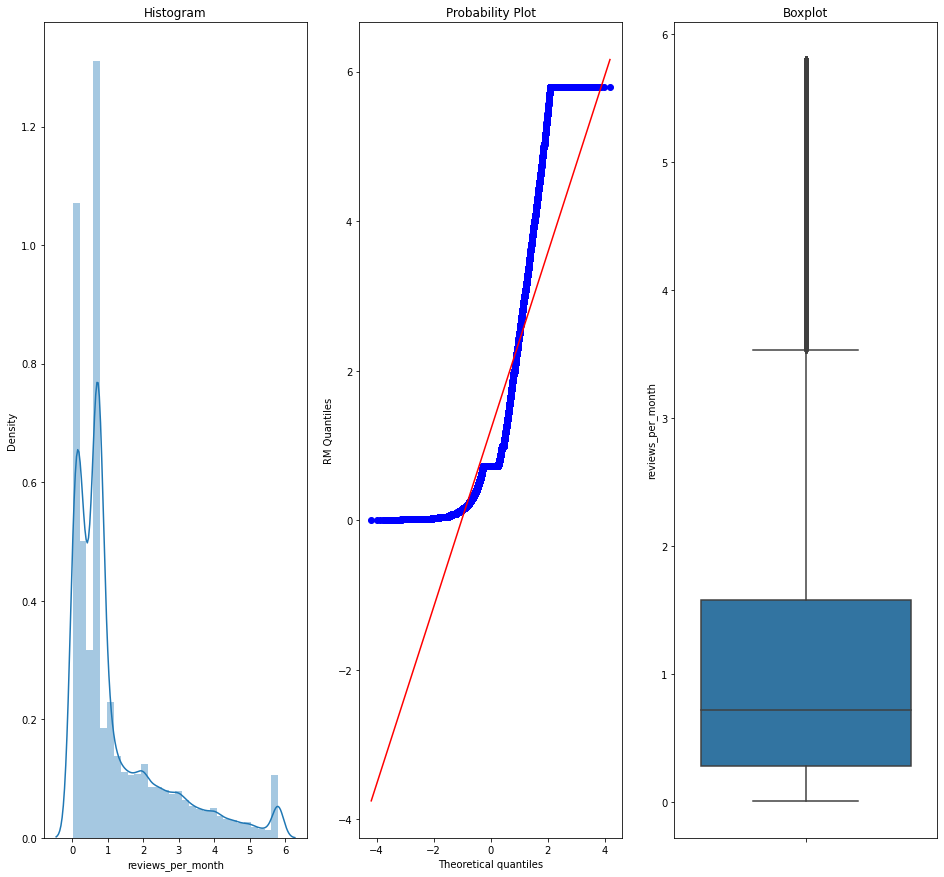

In [200]:
dig_plot(df5_t,'reviews_per_month')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


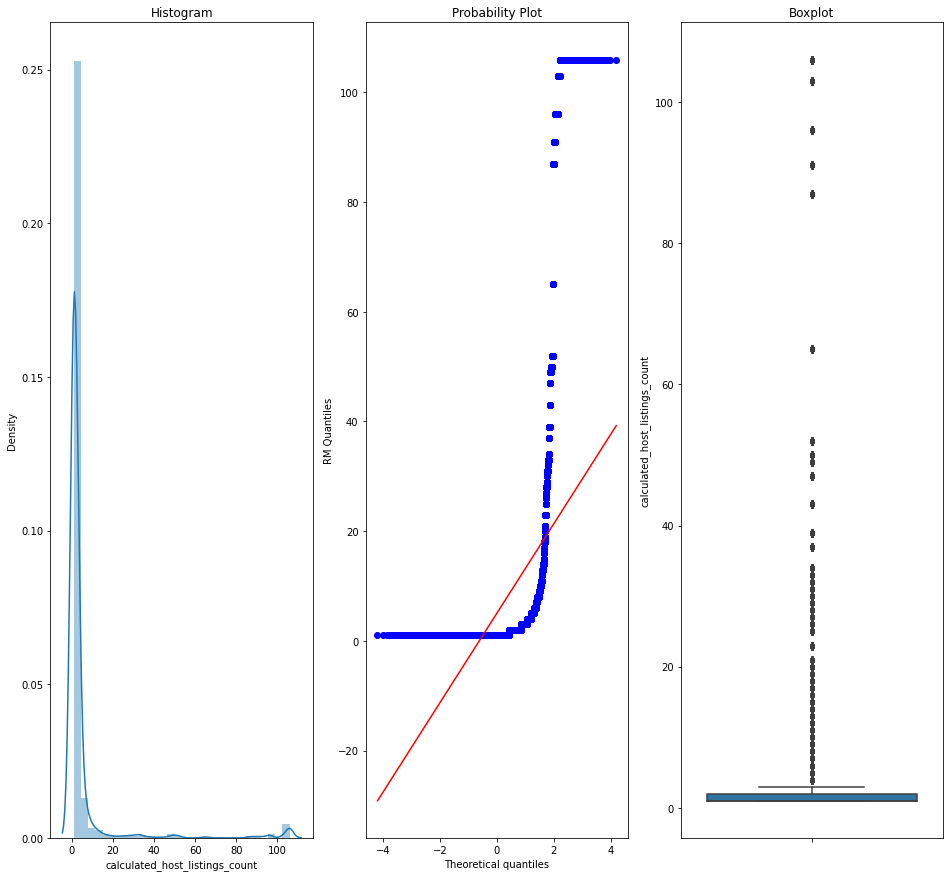

In [201]:
dig_plot(df5_t,'calculated_host_listings_count')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


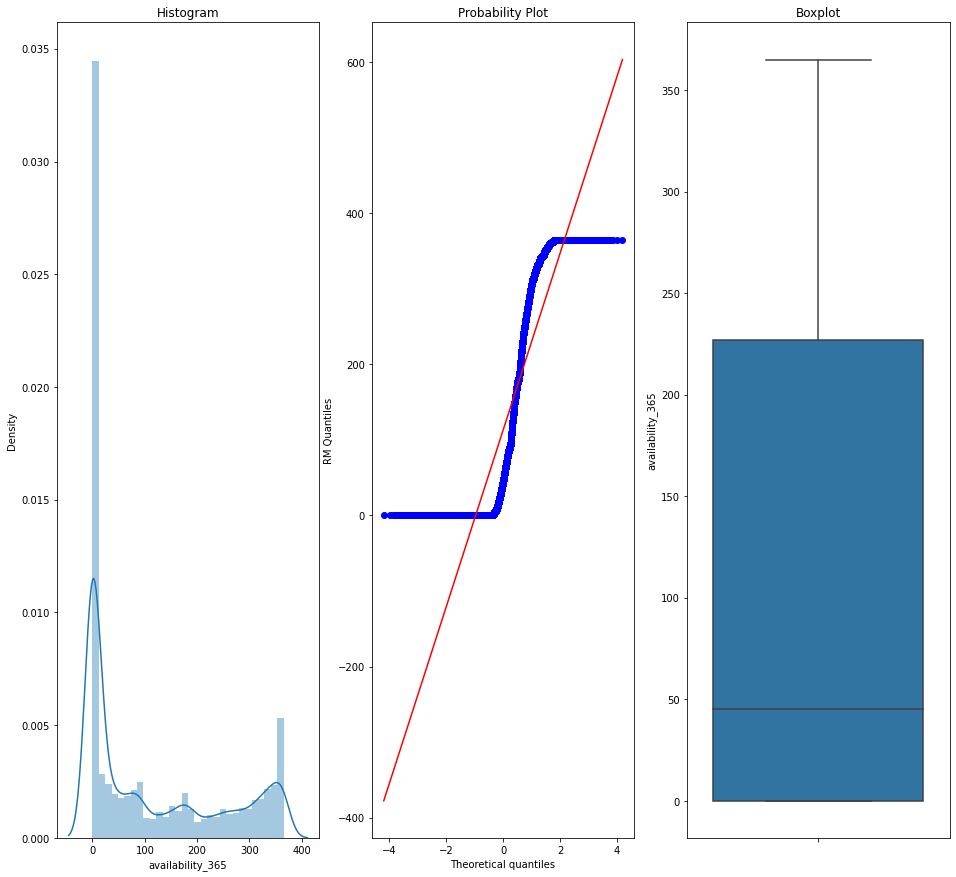

In [202]:
dig_plot(df5_t,'availability_365')

c:\python\python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


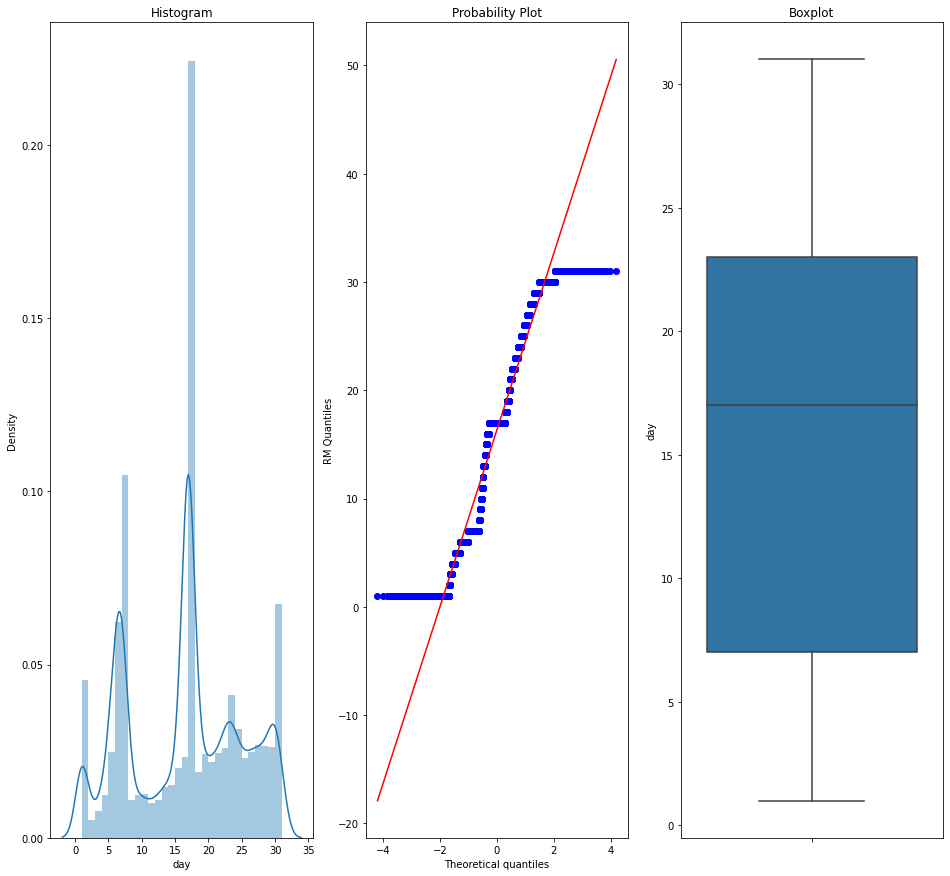

In [203]:
dig_plot(df5_t,'day')

In [204]:
df5_t.describe()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
count,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000
mean,40.728962,-73.952819,144.574928,6.313869,21.651598,1.205599,5.031027,112.781327,2018.434155,5.848819,16.326455,3.193885
std,0.054437,0.042532,125.392995,10.249247,36.463334,1.348546,16.158752,131.622289,1.091414,2.571219,8.391543,1.943342
min,40.565359,-74.090640,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,2011.000000,1.000000,1.000000,0.000000
25%,40.690100,-73.983070,69.000000,1.000000,1.000000,0.280000,1.000000,0.000000,2018.000000,5.000000,7.000000,2.000000
50%,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000,2019.000000,6.000000,17.000000,3.000000
75%,40.763115,-73.936275,175.000000,5.000000,24.000000,1.580000,2.000000,227.000000,2019.000000,6.000000,23.000000,5.000000
max,40.892539,-73.813699,873.183196,68.561611,156.926212,5.801514,106.001539,365.000000,2019.000000,12.000000,31.000000,6.000000


In [205]:
df5_t.corr()

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,year,month,day,week_day
latitude,1.000000,0.095187,0.059961,0.042922,-0.019712,-0.012932,0.042234,-0.010845,-0.009988,-0.001216,0.001083,-0.003309
longitude,0.095187,1.000000,-0.270255,-0.101560,0.059655,0.128350,-0.111137,0.081493,0.078306,-0.009939,-0.013379,0.016013
price,0.059961,-0.270255,1.000000,0.047410,-0.066544,-0.045034,0.113128,0.122526,0.033051,0.006073,-0.001096,-0.006581
minimum_nights,0.042922,-0.101560,0.047410,1.000000,-0.151701,-0.200580,0.377233,0.226293,0.010373,0.013701,0.011202,-0.012656
number_of_reviews,-0.019712,0.059655,-0.066544,-0.151701,1.000000,0.608886,-0.098880,0.184753,0.201724,-0.060837,0.031059,0.041791
reviews_per_month,-0.012932,0.128350,-0.045034,-0.200580,0.608886,1.000000,-0.058197,0.177906,0.389910,-0.112508,0.012926,0.060685
calculated_host_listings_count,0.042234,-0.111137,0.113128,0.377233,-0.098880,-0.058197,1.000000,0.285986,0.071598,0.003102,0.013161,-0.002209
availability_365,-0.010845,0.081493,0.122526,0.226293,0.184753,0.177906,0.285986,1.000000,0.256517,-0.047805,0.010170,0.032877
year,-0.009988,0.078306,0.033051,0.010373,0.201724,0.389910,0.071598,0.256517,1.000000,-0.228896,-0.008705,0.039239
month,-0.001216,-0.009939,0.006073,0.013701,-0.060837,-0.112508,0.003102,-0.047805,-0.228896,1.000000,0.212735,0.121628


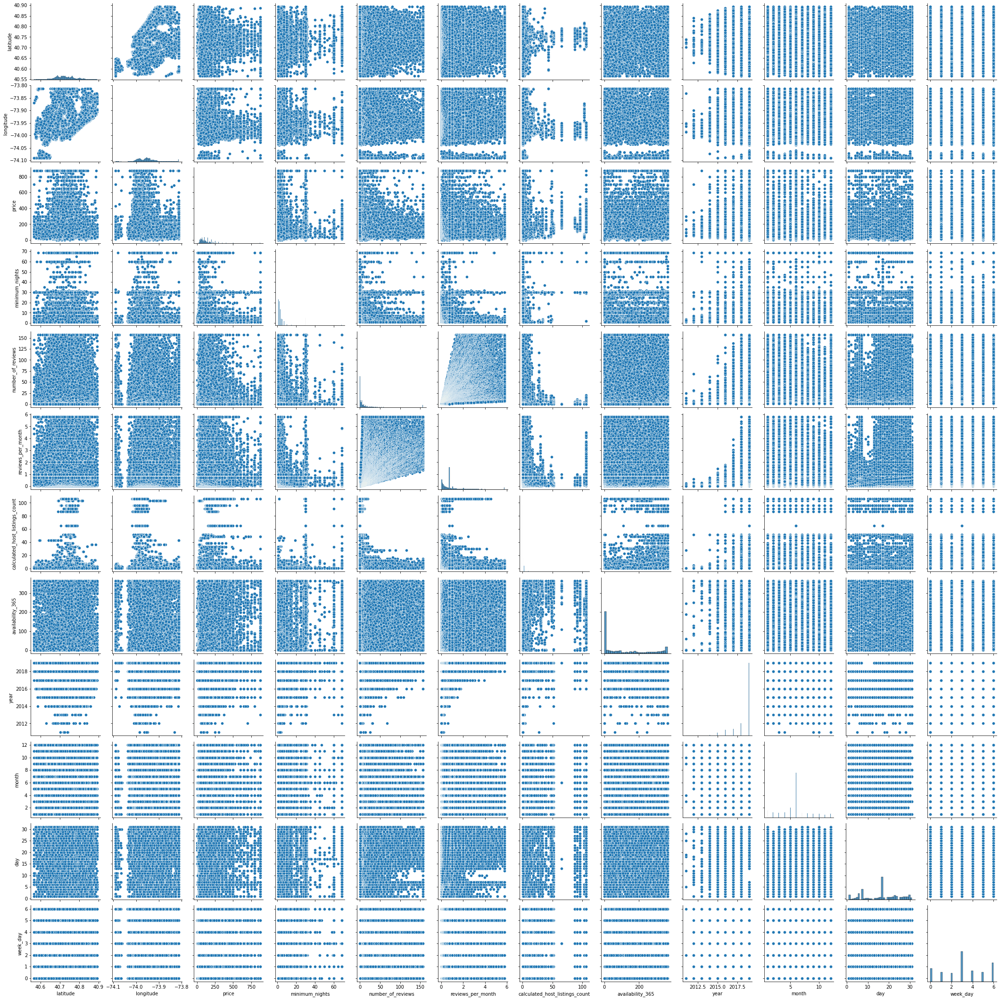

In [206]:
sns.pairplot(df5_t)

In [207]:
winsorizer.left_tail_caps_

{'latitude': 40.56535864649052,
 'longitude': -74.09063982300366,
 'price': -567.7418220547338,
 'minimum_nights': -54.50168643571918,
 'number_of_reviews': -110.37728110826328,
 'reviews_per_month': -3.323653658414041,
 'calculated_host_listings_count': -91.71357454601008,
 'availability_365': -282.08553922106114,
 'day': -8.848173387666982}

In [208]:
winsorizer.right_tail_caps_

{'latitude': 40.89253911483476,
 'longitude': -73.81369940636542,
 'price': 873.1831964283917,
 'minimum_nights': 68.56161076336004,
 'number_of_reviews': 156.92621249184032,
 'reviews_per_month': 5.801513562289693,
 'calculated_host_listings_count': 106.00153855050951,
 'availability_365': 507.6481938892276,
 'day': 41.501082683095966}